
# COM SCI 450.2 FINAL PROJECT

# TITLE: California Disaster Recovery Funding Policy: 95% Reserve
# SUBTITLE: County and hazard-level analysis to guide state obligations under a 'state first' policy.

# PURPOSE: Establish an analytically justified reserve target and coverage framework under a constrained federal posture.

# MISSION: 

# Baseline situational awareness (20+ plots) of California FEMA Public Assistance projects across 58 counties and 12 incident types.

# Scenario analysis of reduced federal obligations, quantifying the state backfill by county, incident type, damage category, and project size, and sizing a P95 monthly reserve.

# SCOPE:

# Single subsetted state dataset (California), Plotly visuals; no external datasets or joins. Totals reported in USD. Timing is presented on declaration and obligation calendars.

# DELIVERABLES:

# Statewide baseline and Top-10 county views.

# Backfill estimates by county, incident type, damage category, project size, and month (obligation calendar).

# P95 monthly reserve estimate with sensitivity (P90/P97.5/P99).

# Tiered backfill guidance (full for life-safety and critical lifelines; partial elsewhere).

# DECISIONS REQUESTED: 

# Adopt a P95 monthly reserve standard under the stated scenario.

# Approve a tiered state backfill framework.

# Direct Top-10 county engagement and operational measures to reduce obligation lags.


In [1]:
import sys
print("Python exe:", sys.executable) 
import plotly.io as pio
pio.renderers.default = "plotly_mimetype"

Python exe: c:\Users\hawai\AppData\Local\Programs\Python\Python313\python.exe


In [2]:
pip install jupyterlab-rise

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.1.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip



## Scenario Controls
- `CUT_RATE`: proportional reduction to **federalShareObligated** (e.g., 0.25 = 25% cut)  
- `STATE_COVER_PCT`: share of the reduced federal dollars the **State** will backfill (remainder to locals)


In [3]:
%pip install geopandas, altair
%pip install vega_datasets

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.1.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip
ERROR: Invalid requirement: 'geopandas,': Expected end or semicolon (after name and no valid version specifier)
    geopandas,
             ^


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.1.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
import sys
print("Python exe:", sys.executable)

Python exe: c:\Users\hawai\AppData\Local\Programs\Python\Python313\python.exe


In [5]:
import sys
!{sys.executable} -m pip install --upgrade geopandas shapely fiona pyproj rtree


[notice] A new release of pip is available: 25.1.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
def rollup(group_cols):
    return (df.groupby(group_cols, dropna=False)
               .agg(state_backfill=("state_backfill","sum"),
                    total_obl=("totalObligated","sum"),
                    federal_obl=("federalObligated","sum"),
                    projects=("projectGuid","count"))
               .reset_index()
               .sort_values("state_backfill", ascending=False))

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import geopandas as gpd
import altair as alt
import matplotlib.patheffects as pe
import matplotlib.dates as mdates
from matplotlib.ticker import FuncFormatter
import re

sns.set_theme(style="whitegrid")
pd.set_option("display.max_columns", 50)
DATA_PATH = "/mnt/data/California PA_2025_Header.csv"


ModuleNotFoundError: No module named 'altair'


## Load & Standardize
We align the headered CSV to a consistent schema and derive `lag_days_obligation` (declaration → obligation) and `applicantShare` if absent.


In [ ]:
DATA_PATH = "California PA_2025_Header.csv"

required = [
    "federalShareObligated", "totalObligated", "totalProjectCost",
    "declarationDate", "obligationDate",
    "countyFips", "county", "incidentType", "category"
]
hdr = pd.read_csv(DATA_PATH, nrows=0).columns

date_cols = [c for c in ["declarationDate","obligationDate","recordModified"] if c in hdr]

df = pd.read_csv(
    DATA_PATH,
    low_memory=False,
    dtype={"countyFips": "string"}, 
    parse_dates=date_cols
)

rename_map = {
    "projectAmount": "totalProjectCost",
    "obligatedDate": "obligationDate",
    "countyCode": "countyFips",
    "lastRefresh": "recordModified",
    "pwNumber": "projectWorksheet",
    "applicationTitle": "projectTitle",
    "applicantId": "projectIdentifier",
    "damageCategoryCode": "categoryCode",
    "damageCategory": "category",
    "stateNumberCode": "femaRegion",
    "id": "projectGuid",
    "hash": "sha1",
}
df = df.rename(columns=rename_map)


for c in ["declarationDate", "obligationDate", "recordModified"]:
    if c in df.columns and not pd.api.types.is_datetime64_any_dtype(df[c]):
        df[c] = pd.to_datetime(df[c], errors="coerce")

if "countyFips" in df.columns:
    df["countyFips"] = df["countyFips"].astype("string").str.zfill(5)
    df.loc[df["countyFips"].str[:2] != "06", "countyFips"] = "06" + df["countyFips"].str[-3:]

for c in ["totalProjectCost","federalShareObligated","totalObligated","mitigationAmount"]:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

if {"totalProjectCost","federalShareObligated"}.issubset(df.columns) and "applicantShare" not in df.columns:
    df["applicantShare"] = df["totalProjectCost"] - df["federalShareObligated"]

if {"obligationDate","declarationDate"}.issubset(df.columns):
    df["lag_days_obligation"] = (df["obligationDate"] - df["declarationDate"]).dt.days

if "declarationDate" in df.columns:
    df["year"] = df["declarationDate"].dt.year

missing = [c for c in required if c not in df.columns]
print("Rows:", len(df))
print("Missing required columns:", missing if missing else "None")
df.head(3)


Rows: 24482
Missing required columns: None


,disasterNumber,declarationDate,incidentType,projectWorksheet,projectTitle,projectIdentifier,categoryCode,projectSize,county,countyFips,state,stateCode,femaRegion,totalProjectCost,federalShareObligated,totalObligated,obligationDate,mitigationAmount,dcc,category,recordModified,sha1,projectGuid,applicantShare,lag_days_obligation,year
0,4353,2018-01-03 00:00:00+00:00,Wildfire,210,District-Wide Fire Hydrant Replacement,083-U0SXP-00,F - Utilities,Large,Santa Barbara County,06083,California,CA,6,218858.74,164144.06,164144.06,2018-10-24 00:00:00+00:00,0.0,F,Utilities,2025-07-22 15:02:40.136000+00:00,078b15b2fd6c9d3f143dd7ec5c40c2ba75147010,fe3c1862-1a84-4977-bfdf-c65128a002f6,54714.68,294,2018
1,4344,2017-10-10 00:00:00+00:00,Fire,184,30 Days at 100% Federal Cost Share - Californi...,000-UVMA1-00,B - Emergency Protective Measures,Small,Statewide,06067,California,CA,6,6791.49,6791.49,6791.49,2018-08-20 00:00:00+00:00,0.0,B,Emergency Protective Measures,2025-07-22 15:02:40.136000+00:00,0c630b8b39ea949ffc472824fe8c472bc7baddac,ac8cf3e7-7b66-48ec-b65b-62164bdbedc9,0.00,314,2017
2,4482,2020-03-22 00:00:00+00:00,Biological,1047,"Stanislaus, County of Office of Emergency Serv...",099-99099-00,B - Emergency Protective Measures,Large,Stanislaus County,06099,California,CA,6,418138.80,418138.80,418138.80,2021-11-24 00:00:00+00:00,0.0,B,Emergency Protective Measures,2025-07-22 15:02:40.136000+00:00,ae8848bfd1778c525237d9337aa7e7beae822106,314cfff0-f4c3-45ca-a353-c1b77805014c,0.00,612,2020



## Part A — Baseline EDA (20+ Plots)
These visuals establish the baseline story: where dollars go, timing, distributional shape, and key relationships.


In [ ]:

def top_n(series, n=12): return series.value_counts().head(n).index

df.columns.tolist()


['disasterNumber',
 'declarationDate',
 'incidentType',
 'projectWorksheet',
 'projectTitle',
 'projectIdentifier',
 'categoryCode',
 'projectSize',
 'county',
 'countyFips',
 'state',
 'stateCode',
 'femaRegion',
 'totalProjectCost',
 'federalShareObligated',
 'totalObligated',
 'obligationDate',
 'mitigationAmount',
 'dcc',
 'category',
 'recordModified',
 'sha1',
 'projectGuid',
 'applicantShare',
 'lag_days_obligation',
 'year']

In [ ]:
county_sum_all = (
    df_full.groupby("countyFips", dropna=True)["totalObligated"]
           .sum()
           .reset_index()
)
county_sum_all["countyFips"] = county_sum_all["countyFips"].astype(str).str.zfill(5)

bad = {"STATEWIDE","Statewide","COUNTYWIDE","Countywide","County-wide","County-Wide"}
name_lkp_all = (
    df_full.loc[df_full["county"].notna() & ~df_full["county"].isin(bad), ["countyFips","county"]]
           .assign(county=lambda s: s["county"].str.replace(r"\s+County$", "", regex=True))
           .drop_duplicates(subset=["countyFips"], keep="first")
)
county_sum_all = county_sum_all.merge(name_lkp_all, on="countyFips", how="left")

counties = alt.topo_feature(
    "https://cdn.jsdelivr.net/npm/us-atlas@3/counties-10m.json",
    "counties"
)

choropleth_full_linear = (
    alt.Chart(counties)
      .mark_geoshape(stroke="white", strokeWidth=0.4)
      .transform_calculate(
          fips='toString(datum.id)',
          state='slice(toString(datum.id), 0, 2)'
      )
      .transform_filter(alt.datum.state == "06")
      .transform_lookup(
          lookup="fips",
          from_=alt.LookupData(
              county_sum_all, key="countyFips",
              fields=["county","totalObligated"]
          )
      )
      .encode(
          color=alt.Color(
              "totalObligated:Q",
              title="Total Obligated (USD)",
              scale=alt.Scale(scheme="viridis"),
              legend=alt.Legend(format="~s")  # e.g., 1M, 10M, 100M, 1B
          ),
          tooltip=[
              alt.Tooltip("county:N", title="County"),
              alt.Tooltip("totalObligated:Q", title="Total Obligated ($)", format=",.0f")
          ]
      )
      .properties(
          width=600, height=750,
          title="California — FEMA PA Total Obligations by County (1999–2025, Including Biological; Linear Scale)"
      )
      .project("albers")
)

choropleth_full_linear

/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert

alt.Chart(...)

In [ ]:
# No Biological (COVID)
incident_col = "incidentType"
bio_mask = (
    df[incident_col]
      .astype(str)
      .str.strip()
      .str.casefold()
      .eq("biological")
)
df_ex = df.loc[~bio_mask].copy()

county_sum = (
    df_ex.groupby("countyFips", dropna=True)["totalObligated"]
         .sum()
         .reset_index()
)
county_sum["countyFips"] = county_sum["countyFips"].astype(str).str.zfill(5)

bad = {"STATEWIDE","Statewide","COUNTYWIDE","Countywide","County-wide","County-Wide"}
name_lkp = (
    df_ex.loc[df_ex["county"].notna() & ~df_ex["county"].isin(bad), ["countyFips","county"]]
       .assign(county=lambda s: s["county"].str.replace(r"\s+County$", "", regex=True))
       .drop_duplicates(subset=["countyFips"], keep="first")
)
county_sum = county_sum.merge(name_lkp, on="countyFips", how="left")

counties = alt.topo_feature(
    "https://cdn.jsdelivr.net/npm/us-atlas@3/counties-10m.json",
    "counties"
)

choropleth_ex = (
    alt.Chart(counties)
      .mark_geoshape(stroke="white", strokeWidth=0.4)
      .transform_calculate(
          fips='toString(datum.id)',
          state='slice(toString(datum.id), 0, 2)'
      )
      .transform_filter(alt.datum.state == "06")
      .transform_lookup(
          lookup="fips",
          from_=alt.LookupData(county_sum, key="countyFips",
                               fields=["county","totalObligated"])
      )
      .encode(
          color=alt.Color("totalObligated:Q",
                          title="Total Obligated (USD)",
                          scale=alt.Scale(scheme="viridis", type="log")),
          tooltip=[
              alt.Tooltip("county:N", title="County"),
              alt.Tooltip("totalObligated:Q", title="Total Obligated ($)", format=",.0f")
          ]
      )
      .properties(
          width=600, height=750,
          title="California — FEMA PA Total Obligations by County (1999–2025, Excluding Biological)"
      )
      .project("albers")
)

choropleth_ex


/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert

alt.Chart(...)

/tmp/ipykernel_238/2644694935.py:1: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



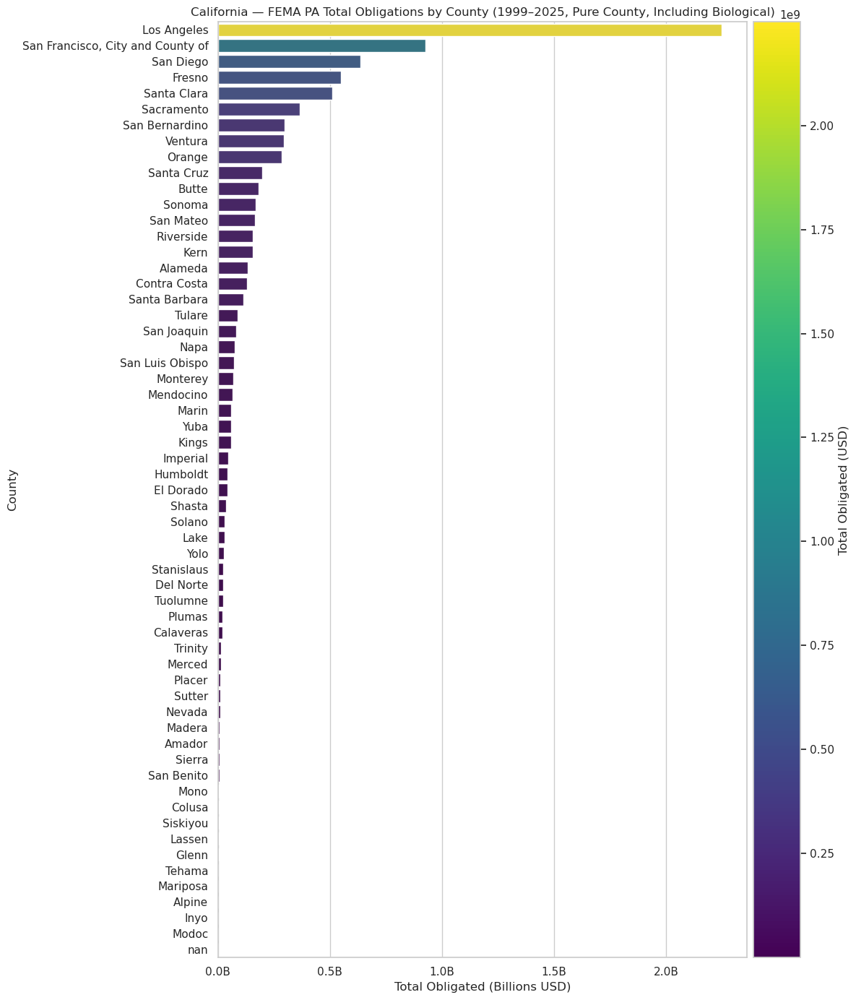

In [ ]:
mask_county_only = ~df["county"].astype(str).str.contains(
    r"\b(statewide|county[\s-]*wide)\b", flags=re.IGNORECASE, na=False
)

df_full_county = df.loc[mask_county_only].copy()
df_full_county["county_clean"] = df_full_county["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

county_tot_full = (
    df_full_county.groupby("county_clean", as_index=False)["totalObligated"].sum()
                  .sort_values("totalObligated", ascending=False)
)

norm = plt.Normalize(county_tot_full["totalObligated"].min(), county_tot_full["totalObligated"].max())
colors = plt.cm.viridis(norm(county_tot_full["totalObligated"].values))
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])

plt.figure(figsize=(12, 14))
ax = sns.barplot(
    data=county_tot_full,
    x="totalObligated", y="county_clean",
    orient="h",
    palette=colors
)

ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x/1e9:.1f}B"))

plt.title("California — FEMA PA Total Obligations by County (1999–2025, Pure County, Including Biological)")
plt.xlabel("Total Obligated (Billions USD)")
plt.ylabel("County")

cbar = plt.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label("Total Obligated (USD)")

plt.tight_layout()
plt.show()

/tmp/ipykernel_238/3264325095.py:1: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



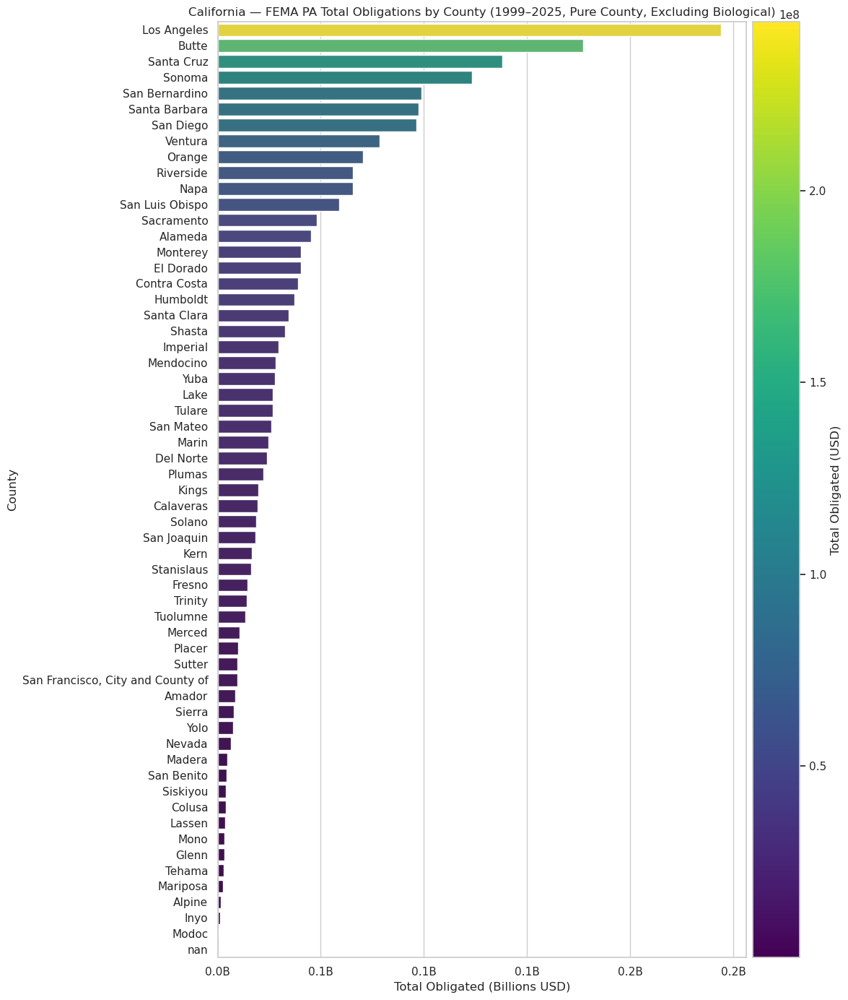

In [ ]:
mask_county_only = ~df["county"].astype(str).str.contains(
    r"\b(statewide|county[\s-]*wide)\b", flags=re.IGNORECASE, na=False
)
mask_non_bio = ~df["incidentType"].astype(str).str.strip().str.casefold().eq("biological")

df_ex_county = df.loc[mask_county_only & mask_non_bio].copy()
df_ex_county["county_clean"] = df_ex_county["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

county_tot_ex = (
    df_ex_county.groupby("county_clean", as_index=False)["totalObligated"].sum()
                .sort_values("totalObligated", ascending=False)
)

norm_ex = plt.Normalize(county_tot_ex["totalObligated"].min(), county_tot_ex["totalObligated"].max())
colors_ex = plt.cm.viridis(norm_ex(county_tot_ex["totalObligated"].values))
sm_ex = plt.cm.ScalarMappable(cmap="viridis", norm=norm_ex)
sm_ex.set_array([])

plt.figure(figsize=(12, 14))
ax = sns.barplot(
    data=county_tot_ex,
    x="totalObligated", y="county_clean",
    orient="h",
    palette=colors_ex
)

ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x/1e9:.1f}B"))

plt.title("California — FEMA PA Total Obligations by County (1999–2025, Pure County, Excluding Biological)")
plt.xlabel("Total Obligated (Billions USD)")
plt.ylabel("County")

cbar = plt.colorbar(sm_ex, ax=ax, pad=0.01)
cbar.set_label("Total Obligated (USD)")

plt.tight_layout()
plt.show()

/tmp/ipykernel_1582/1687692219.py:1: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



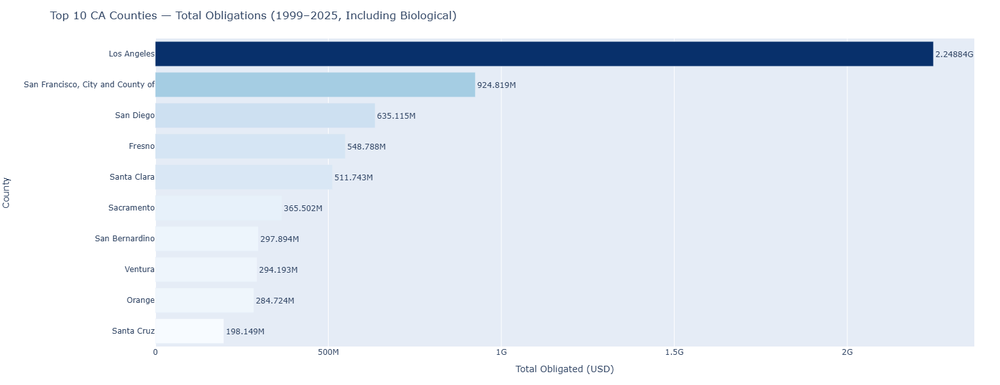

In [ ]:
mask_county_only = ~df["county"].astype(str).str.contains(r"\b(statewide|county[\s-]*wide)\b",
                                                          flags=re.IGNORECASE, na=False)
df_full_cty = df.loc[mask_county_only].copy()
df_full_cty["county_clean"] = df_full_cty["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

top10_full = (
    df_full_cty.groupby("county_clean", as_index=False)["totalObligated"]
               .sum()
               .nlargest(10, "totalObligated")
               .sort_values("totalObligated", ascending=True) 
)

fig = px.bar(
    top10_full, x="totalObligated", y="county_clean",
    orientation="h", color="totalObligated", color_continuous_scale="Blues",
    text="totalObligated",
    labels={"totalObligated":"Total Obligated (USD)","county_clean":"County"},
    title="Top 10 CA Counties — Total Obligations (1999–2025, Including Biological)"
)
fig.update_traces(texttemplate="%{text:~s}", textposition="outside",
                  hovertemplate="<b>%{y}</b><br>Total: %{x:,.0f}")
fig.update_layout(xaxis_tickformat="~s", height=600, width=900, coloraxis_showscale=False,
                  margin=dict(l=140, r=40, t=60, b=60))
fig.show()

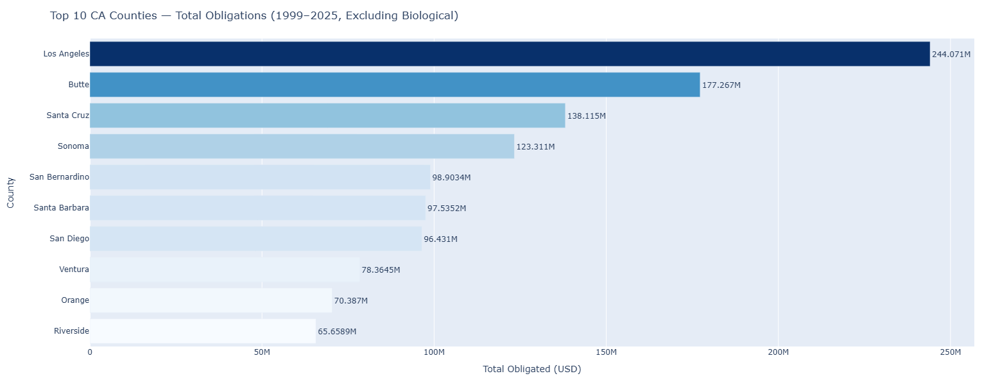

In [ ]:
mask_non_bio = ~df["incidentType"].astype(str).str.strip().str.casefold().eq("biological")
df_ex_cty = df.loc[mask_county_only & mask_non_bio].copy()
df_ex_cty["county_clean"] = df_ex_cty["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

top10_ex = (
    df_ex_cty.groupby("county_clean", as_index=False)["totalObligated"]
             .sum()
             .nlargest(10, "totalObligated")
             .sort_values("totalObligated", ascending=True)
)

fig = px.bar(
    top10_ex, x="totalObligated", y="county_clean",
    orientation="h", color="totalObligated", color_continuous_scale="Blues",
    text="totalObligated",
    labels={"totalObligated":"Total Obligated (USD)","county_clean":"County"},
    title="Top 10 CA Counties — Total Obligations (1999–2025, Excluding Biological)"
)
fig.update_traces(texttemplate="%{text:~s}", textposition="outside",
                  hovertemplate="<b>%{y}</b><br>Total: %{x:,.0f}")
fig.update_layout(xaxis_tickformat="~s", height=600, width=900, coloraxis_showscale=False,
                  margin=dict(l=140, r=40, t=60, b=60))
fig.show()

In [ ]:
incident_tot_full = (
    df.groupby("incidentType", as_index=False)["totalObligated"].sum()
      .sort_values("totalObligated", ascending=False)
)

inc_bar_full = (
    alt.Chart(incident_tot_full)
      .mark_bar()
      .encode(
          x=alt.X("totalObligated:Q", title="Total Obligated (USD)", axis=alt.Axis(format="~s")),
          y=alt.Y("incidentType:N", sort='-x', title="Incident Type"),
          color=alt.Color("incidentType:N", title="Incident Type", legend=alt.Legend(orient="right")),
          tooltip=[
              alt.Tooltip("incidentType:N", title="Incident Type"),
              alt.Tooltip("totalObligated:Q", title="Total Obligated ($)", format=",.0f")
          ]
      )
      .properties(width=700, height=500,
                  title="California — FEMA PA Obligations by Incident Type (1999–2025, Including Biological)")
)

inc_bar_full

/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning:

the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.



alt.Chart(...)

In [ ]:
mask_non_bio = ~df["incidentType"].astype(str).str.strip().str.casefold().eq("biological")

incident_tot_ex = (
    df.loc[mask_non_bio].groupby("incidentType", as_index=False)["totalObligated"].sum()
      .sort_values("totalObligated", ascending=False)
)

inc_bar_ex = (
    alt.Chart(incident_tot_ex)
      .mark_bar()
      .encode(
          x=alt.X("totalObligated:Q", title="Total Obligated (USD)", axis=alt.Axis(format="~s")),
          y=alt.Y("incidentType:N", sort='-x', title="Incident Type"),
          color=alt.Color("incidentType:N", title="Incident Type", legend=alt.Legend(orient="right")),
          tooltip=[
              alt.Tooltip("incidentType:N", title="Incident Type"),
              alt.Tooltip("totalObligated:Q", title="Total Obligated ($)", format=",.0f")
          ]
      )
      .properties(width=700, height=500,
                  title="California — FEMA PA Obligations by Incident Type (1999–2025, Excluding Biological)")
)

inc_bar_ex


/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning:

the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.



alt.Chart(...)

/tmp/ipykernel_1582/1870653643.py:1: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



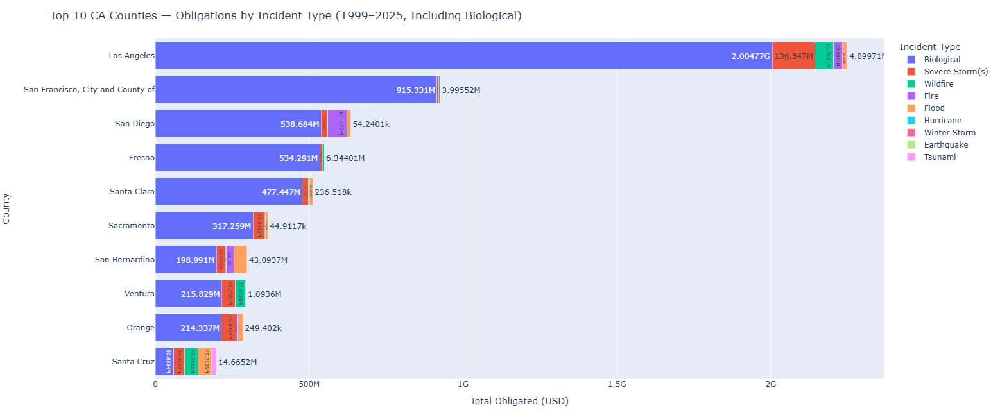

In [ ]:
mask_county_only = ~df["county"].astype(str).str.contains(r"\b(statewide|county[\s-]*wide)\b",
                                                          flags=re.IGNORECASE, na=False)
df_q = df.loc[mask_county_only].copy()
df_q["county_clean"] = df_q["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

top10 = (df_q.groupby("county_clean", as_index=False)["totalObligated"].sum()
           .nlargest(10, "totalObligated")["county_clean"])

mix = (df_q[df_q["county_clean"].isin(top10)]
         .groupby(["county_clean","incidentType"], as_index=False)["totalObligated"].sum())

order = (mix.groupby("county_clean")["totalObligated"].sum()
             .sort_values(ascending=False).index.tolist())

fig = px.bar(
    mix, x="totalObligated", y="county_clean", color="incidentType", orientation="h",
    text="totalObligated", category_orders={"county_clean": order},
    labels={"totalObligated":"Total Obligated (USD)","county_clean":"County"},
    title="Top 10 CA Counties — Obligations by Incident Type (1999–2025, Including Biological)"
).update_traces(texttemplate="%{text:~s}", textposition="outside",
                hovertemplate="<b>%{y}</b><br>%{color}: %{x:,.0f}") \
 .update_layout(xaxis_tickformat="~s", height=650, width=1000, barmode="stack",
                legend_title_text="Incident Type", margin=dict(l=160, r=40, t=60, b=60))
fig.show()

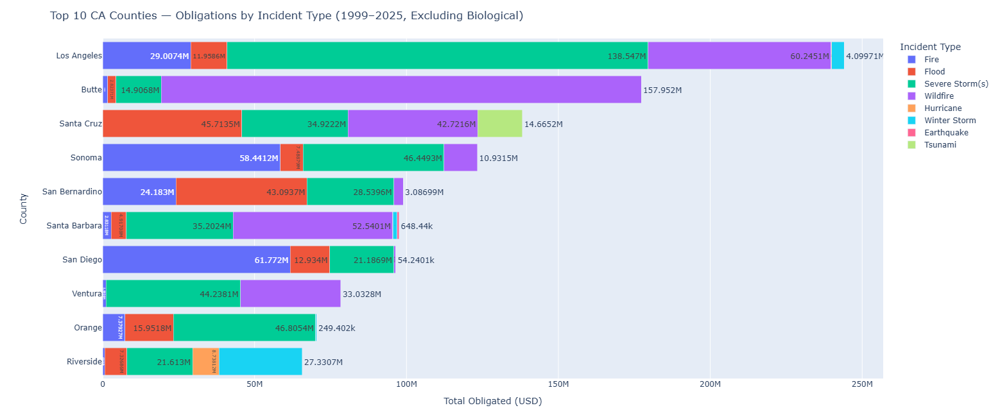

In [ ]:
mask_non_bio = ~df["incidentType"].astype(str).str.strip().str.casefold().eq("biological")
df_q = df.loc[mask_county_only & mask_non_bio].copy()
df_q["county_clean"] = df_q["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

top10 = (df_q.groupby("county_clean", as_index=False)["totalObligated"].sum()
           .nlargest(10, "totalObligated")["county_clean"])

mix = (df_q[df_q["county_clean"].isin(top10)]
         .groupby(["county_clean","incidentType"], as_index=False)["totalObligated"].sum())

order = (mix.groupby("county_clean")["totalObligated"].sum()
             .sort_values(ascending=False).index.tolist())

fig = px.bar(
    mix, x="totalObligated", y="county_clean", color="incidentType", orientation="h",
    text="totalObligated", category_orders={"county_clean": order},
    labels={"totalObligated":"Total Obligated (USD)","county_clean":"County"},
    title="Top 10 CA Counties — Obligations by Incident Type (1999–2025, Excluding Biological)"
).update_traces(texttemplate="%{text:~s}", textposition="outside",
                hovertemplate="<b>%{y}</b><br>%{color}: %{x:,.0f}") \
 .update_layout(xaxis_tickformat="~s", height=650, width=1000, barmode="stack",
                legend_title_text="Incident Type", margin=dict(l=160, r=40, t=60, b=60))
fig.show()

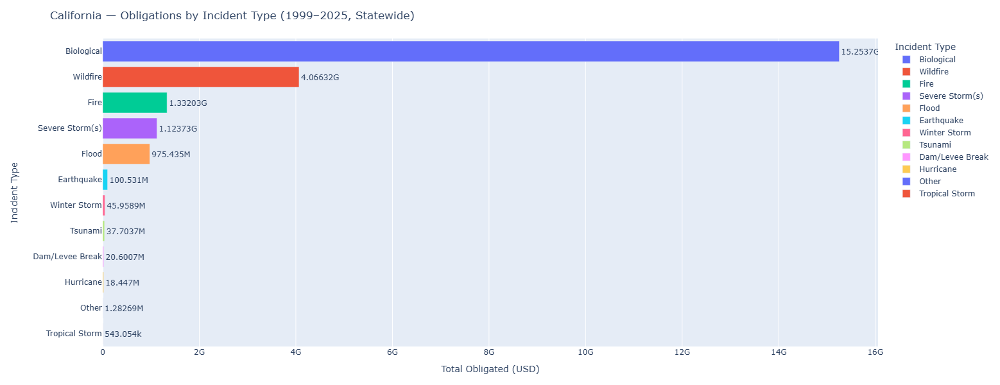

In [ ]:
inc_state = (df.groupby("incidentType", as_index=False)["totalObligated"]
               .sum().sort_values("totalObligated", ascending=False))

fig = px.bar(
    inc_state, x="totalObligated", y="incidentType", orientation="h",
    color="incidentType", text="totalObligated",
    labels={"totalObligated":"Total Obligated (USD)","incidentType":"Incident Type"},
    title="California — Obligations by Incident Type (1999–2025, Statewide)"
)
fig.update_traces(texttemplate="%{text:~s}", textposition="outside",
                  hovertemplate="<b>%{y}</b><br>Total: %{x:,.0f}")
fig.update_layout(xaxis_tickformat="~s", height=600, width=900,
                  legend_title_text="Incident Type", margin=dict(l=160, r=40, t=60, b=60))
fig.show()

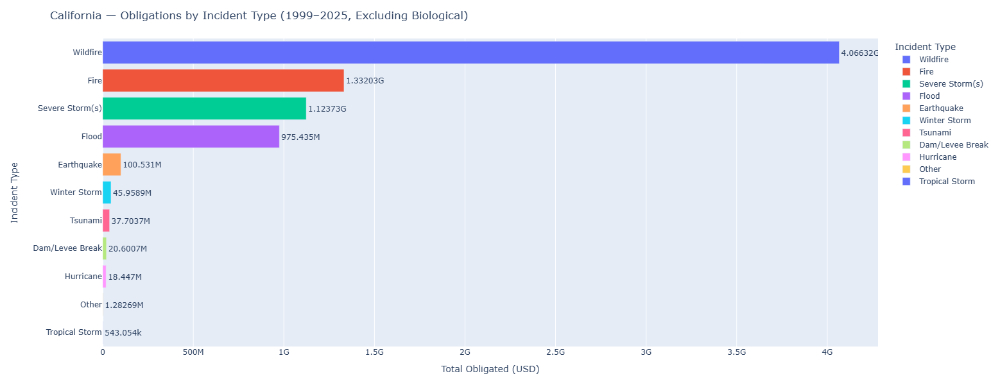

In [ ]:
mask_non_bio = ~df["incidentType"].astype(str).str.strip().str.casefold().eq("biological")
inc_state_ex = (df.loc[mask_non_bio].groupby("incidentType", as_index=False)["totalObligated"]
                  .sum().sort_values("totalObligated", ascending=False))

fig = px.bar(
    inc_state_ex, x="totalObligated", y="incidentType", orientation="h",
    color="incidentType", text="totalObligated",
    labels={"totalObligated":"Total Obligated (USD)","incidentType":"Incident Type"},
    title="California — Obligations by Incident Type (1999–2025, Excluding Biological)"
)
fig.update_traces(texttemplate="%{text:~s}", textposition="outside",
                  hovertemplate="<b>%{y}</b><br>Total: %{x:,.0f}")
fig.update_layout(xaxis_tickformat="~s", height=600, width=900,
                  legend_title_text="Incident Type", margin=dict(l=160, r=40, t=60, b=60))
fig.show()

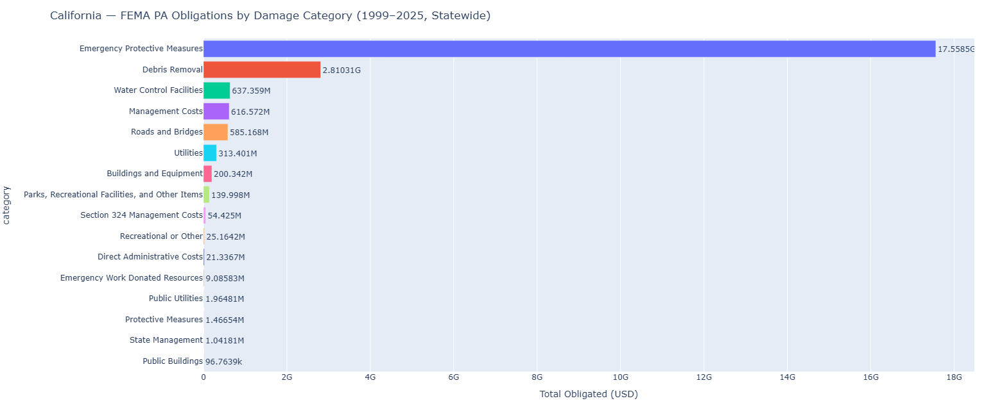

In [ ]:
dc_state = (
    df.groupby("category", as_index=False)["totalObligated"]
      .sum()
      .sort_values("totalObligated", ascending=False)
)

fig_dc_state = px.bar(
    dc_state,
    x="totalObligated", y="category",
    orientation="h",
    color="category",     
    text="totalObligated",
    labels={"totalObligated":"Total Obligated (USD)", "damageCategory":"Damage Category"},
    title="California — FEMA PA Obligations by Damage Category (1999–2025, Statewide)"
)

n_cats = dc_state["category"].nunique()
fig_dc_state.update_traces(
    texttemplate="%{text:~s}",
    textposition="outside",
    hovertemplate="<b>%{y}</b><br>Total: %{x:,.0f}"
)
fig_dc_state.update_layout(
    xaxis_tickformat="~s",
    height=max(400, 40 * n_cats),
    showlegend=False,                      
    margin=dict(l=220, r=40, t=60, b=60)
)

fig_dc_state.show()

/tmp/ipykernel_1582/3734459563.py:1: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



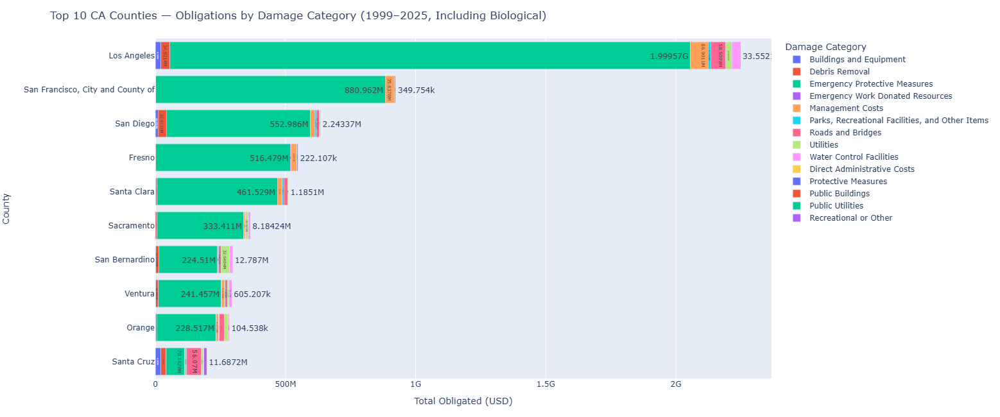

In [ ]:
mask_county_only = ~df["county"].astype(str).str.contains(
    r"\b(statewide|county[\s-]*wide)\b", flags=re.IGNORECASE, na=False
)
df_full_cty = df.loc[mask_county_only].copy()
df_full_cty["county_clean"] = df_full_cty["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

top10_with = (
    df_full_cty.groupby("county_clean", as_index=False)["totalObligated"]
               .sum()
               .nlargest(10, "totalObligated")["county_clean"]
)

mix_with = (
    df_full_cty[df_full_cty["county_clean"].isin(top10_with)]
      .groupby(["county_clean","category"], as_index=False)["totalObligated"]
      .sum()
)

order_with = (
    mix_with.groupby("county_clean")["totalObligated"].sum()
            .sort_values(ascending=False).index.tolist()
)

fig_dc_top10_with = px.bar(
    mix_with,
    x="totalObligated", y="county_clean",
    color="category",
    orientation="h",
    text="totalObligated",
    category_orders={"county_clean": order_with},
    labels={"totalObligated":"Total Obligated (USD)", "county_clean":"County"},
    title="Top 10 CA Counties — Obligations by Damage Category (1999–2025, Including Biological)"
)

fig_dc_top10_with.update_traces(
    texttemplate="%{text:~s}",
    textposition="outside",
    hovertemplate="<b>%{y}</b><br>%{color}: %{x:,.0f}"
)
fig_dc_top10_with.update_layout(
    xaxis_tickformat="~s",
    height=650, width=1000,
    legend_title_text="Damage Category",
    barmode="stack",
    margin=dict(l=160, r=40, t=60, b=60)
)

fig_dc_top10_with.show()

/tmp/ipykernel_1582/2069669024.py:1: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



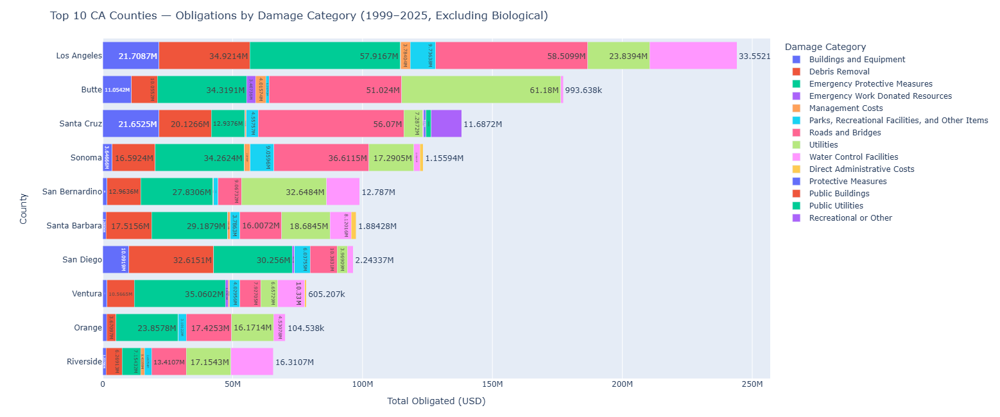

In [ ]:
mask_county_only = ~df["county"].astype(str).str.contains(
    r"\b(statewide|county[\s-]*wide)\b", flags=re.IGNORECASE, na=False
)
mask_non_bio = ~df["incidentType"].astype(str).str.strip().str.casefold().eq("biological")

df_ex_cty = df.loc[mask_county_only & mask_non_bio].copy()
df_ex_cty["county_clean"] = df_ex_cty["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

top10_without = (
    df_ex_cty.groupby("county_clean", as_index=False)["totalObligated"]
             .sum()
             .nlargest(10, "totalObligated")["county_clean"]
)

mix_without = (
    df_ex_cty[df_ex_cty["county_clean"].isin(top10_without)]
      .groupby(["county_clean","category"], as_index=False)["totalObligated"]
      .sum()
)

order_without = (
    mix_without.groupby("county_clean")["totalObligated"].sum()
               .sort_values(ascending=False).index.tolist()
)

fig_dc_top10_without = px.bar(
    mix_without,
    x="totalObligated", y="county_clean",
    color="category",
    orientation="h",
    text="totalObligated",
    category_orders={"county_clean": order_without},
    labels={"totalObligated":"Total Obligated (USD)", "county_clean":"County"},
    title="Top 10 CA Counties — Obligations by Damage Category (1999–2025, Excluding Biological)"
)

fig_dc_top10_without.update_traces(
    texttemplate="%{text:~s}",
    textposition="outside",
    hovertemplate="<b>%{y}</b><br>%{color}: %{x:,.0f}"
)
fig_dc_top10_without.update_layout(
    xaxis_tickformat="~s",
    height=650, width=1000,
    legend_title_text="Damage Category",
    barmode="stack",
    margin=dict(l=160, r=40, t=60, b=60)
)

fig_dc_top10_without.show()

/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


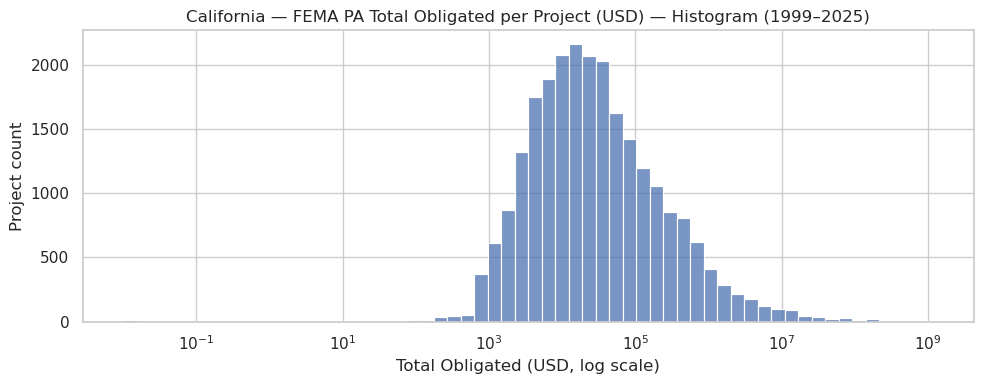

In [ ]:
amt = df["totalObligated"].dropna()
amt_pos = amt[amt > 0]

plt.figure(figsize=(10, 4))
sns.histplot(amt_pos, bins=60, log_scale=True)
plt.title("California — FEMA PA Total Obligated per Project (USD) — Histogram (1999–2025)")
plt.xlabel("Total Obligated (USD, log scale)")
plt.ylabel("Project count")
plt.tight_layout()
plt.show()

/tmp/ipykernel_1582/3242649005.py:1: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.

/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



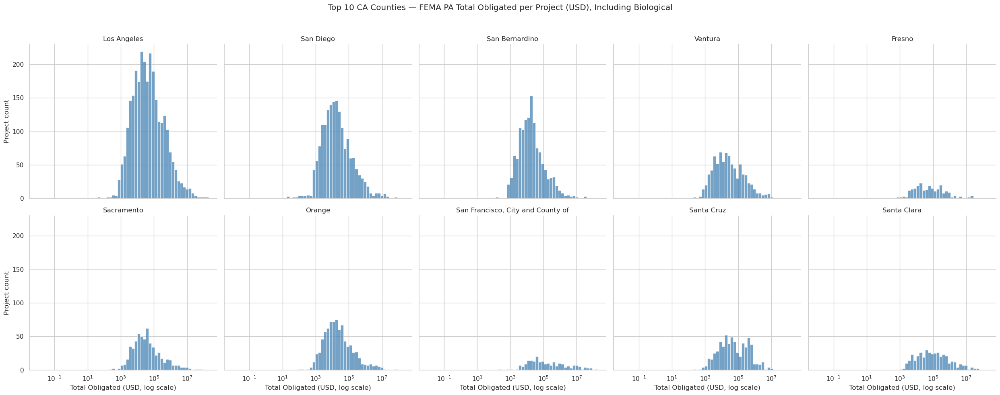

In [ ]:
mask_county_only = ~df["county"].astype(str).str.contains(
    r"\b(statewide|county[\s-]*wide)\b", flags=re.IGNORECASE, na=False
)
df_full_cty = df.loc[mask_county_only].copy()
df_full_cty["county_clean"] = df_full_cty["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

top10_with = (
    df_full_cty.groupby("county_clean", as_index=False)["totalObligated"]
               .sum()
               .nlargest(10, "totalObligated")["county_clean"]
)

d_with = df_full_cty[df_full_cty["county_clean"].isin(top10_with)].copy()
d_with["totalObligated"] = pd.to_numeric(d_with["totalObligated"], errors="coerce")
d_with = d_with.replace([np.inf, -np.inf], np.nan).dropna(subset=["totalObligated"])
d_with = d_with[d_with["totalObligated"] > 0]

g = sns.displot(
    data=d_with,
    x="totalObligated",
    col="county_clean",
    col_wrap=5,               
    bins=60,
    kde=False,
    log_scale=True,          
    color="steelblue",
    facet_kws={"sharex": True, "sharey": True}
)

g.set_axis_labels("Total Obligated (USD, log scale)", "Project count")
g.set_titles("{col_name}")
plt.subplots_adjust(top=0.88)
g.fig.suptitle("Top 10 CA Counties — FEMA PA Total Obligated per Project (USD), Including Biological")
plt.show()

/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



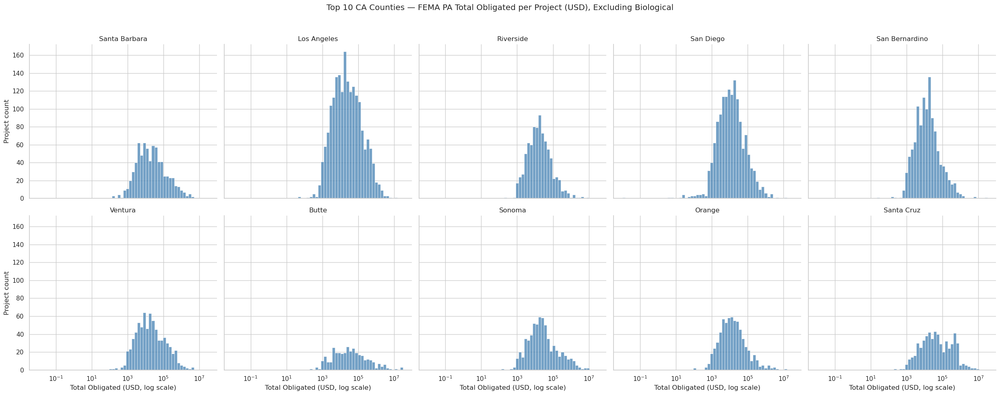

In [ ]:
mask_non_bio = ~df["incidentType"].astype(str).str.strip().str.casefold().eq("biological")
df_ex_cty = df.loc[mask_county_only & mask_non_bio].copy()
df_ex_cty["county_clean"] = df_ex_cty["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

top10_without = (
    df_ex_cty.groupby("county_clean", as_index=False)["totalObligated"]
             .sum()
             .nlargest(10, "totalObligated")["county_clean"]
)

d_without = df_ex_cty[df_ex_cty["county_clean"].isin(top10_without)].copy()
d_without["totalObligated"] = pd.to_numeric(d_without["totalObligated"], errors="coerce")
d_without = d_without.replace([np.inf, -np.inf], np.nan).dropna(subset=["totalObligated"])
d_without = d_without[d_without["totalObligated"] > 0]

g = sns.displot(
    data=d_without,
    x="totalObligated",
    col="county_clean",
    col_wrap=5,
    bins=60,
    kde=False,
    log_scale=True,
    color="steelblue",
    facet_kws={"sharex": True, "sharey": True}
)

g.set_axis_labels("Total Obligated (USD, log scale)", "Project count")
g.set_titles("{col_name}")
plt.subplots_adjust(top=0.88)
g.fig.suptitle("Top 10 CA Counties — FEMA PA Total Obligated per Project (USD), Excluding Biological")
plt.show()

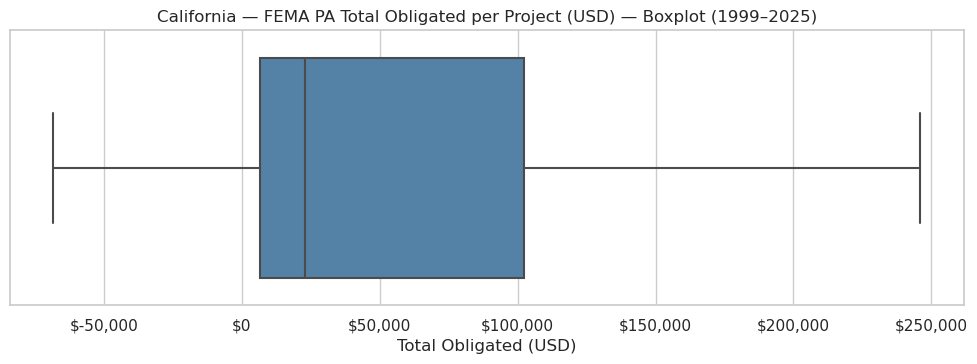

In [ ]:
amt = pd.to_numeric(df["totalObligated"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()

plt.figure(figsize=(10, 3.8))
sns.boxplot(x=amt, showfliers=False, color="steelblue")
plt.title("California — FEMA PA Total Obligated per Project (USD) — Boxplot (1999–2025)")
plt.xlabel("Total Obligated (USD)")
plt.gca().xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"${x:,.0f}"))
plt.tight_layout()
plt.show()

/tmp/ipykernel_1582/66112683.py:1: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



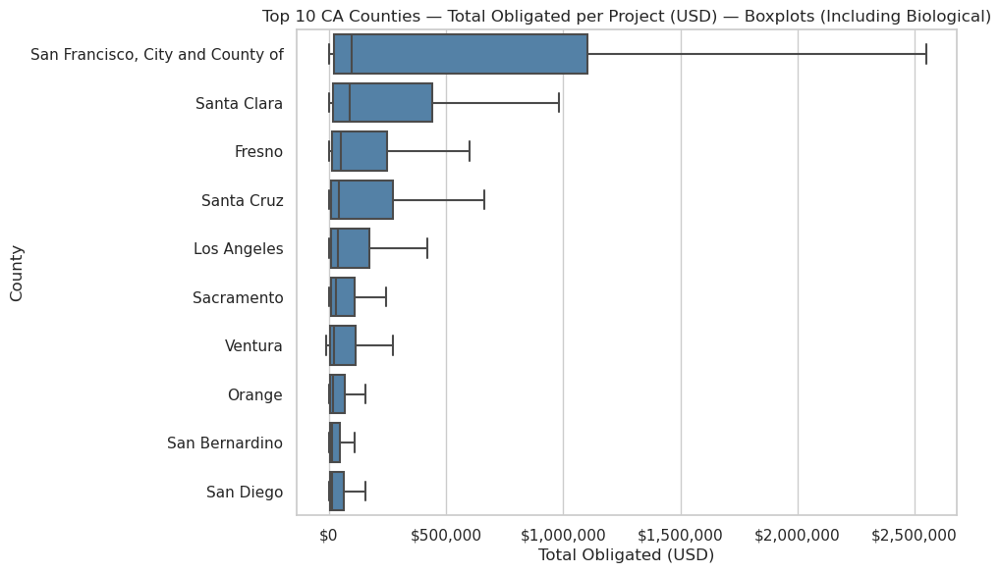

In [ ]:
mask_county_only = ~df["county"].astype(str).str.contains(r"\b(statewide|county[\s-]*wide)\b",
                                                          flags=re.IGNORECASE, na=False)
d = df.loc[mask_county_only].copy()
d["county_clean"] = d["county"].astype(str).str.replace(r"\s+County$", "", regex=True)
d["totalObligated"] = pd.to_numeric(d["totalObligated"], errors="coerce").replace([np.inf, -np.inf], np.nan)

top10_inc = (d.groupby("county_clean", as_index=False)["totalObligated"].sum()
               .nlargest(10, "totalObligated")["county_clean"].tolist())

sub_inc = d[d["county_clean"].isin(top10_inc)].dropna(subset=["totalObligated"]).copy()

order_inc = (sub_inc.groupby("county_clean")["totalObligated"].median()
                 .sort_values(ascending=False).index.tolist())

plt.figure(figsize=(10, 6))
sns.boxplot(
    data=sub_inc,
    x="totalObligated", y="county_clean",
    order=order_inc,
    showfliers=False, color="steelblue"
)
plt.title("Top 10 CA Counties — Total Obligated per Project (USD) — Boxplots (Including Biological)")
plt.xlabel("Total Obligated (USD)")
plt.ylabel("County")
plt.gca().xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"${x:,.0f}"))
plt.tight_layout()
plt.show()

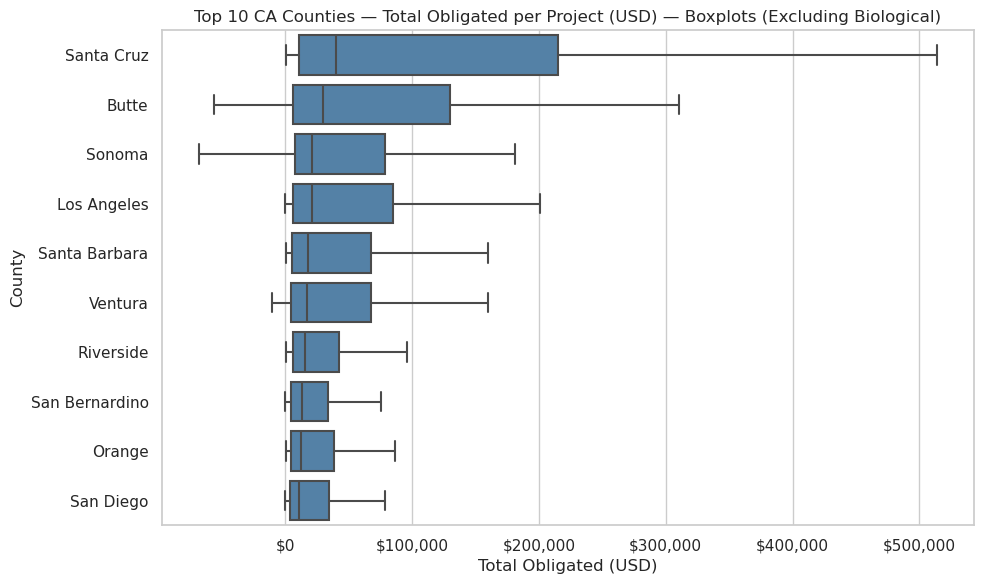

In [ ]:
mask_non_bio = ~df["incidentType"].astype(str).str.strip().str.casefold().eq("biological")
d_ex = df.loc[mask_county_only & mask_non_bio].copy()
d_ex["county_clean"] = d_ex["county"].astype(str).str.replace(r"\s+County$", "", regex=True)
d_ex["totalObligated"] = pd.to_numeric(d_ex["totalObligated"], errors="coerce").replace([np.inf, -np.inf], np.nan)

top10_ex = (d_ex.groupby("county_clean", as_index=False)["totalObligated"].sum()
              .nlargest(10, "totalObligated")["county_clean"].tolist())

sub_ex = d_ex[d_ex["county_clean"].isin(top10_ex)].dropna(subset=["totalObligated"]).copy()

order_ex = (sub_ex.groupby("county_clean")["totalObligated"].median()
                .sort_values(ascending=False).index.tolist())

plt.figure(figsize=(10, 6))
sns.boxplot(
    data=sub_ex,
    x="totalObligated", y="county_clean",
    order=order_ex,
    showfliers=False, color="steelblue"
)
plt.title("Top 10 CA Counties — Total Obligated per Project (USD) — Boxplots (Excluding Biological)")
plt.xlabel("Total Obligated (USD)")
plt.ylabel("County")
plt.gca().xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"${x:,.0f}"))
plt.tight_layout()
plt.show()

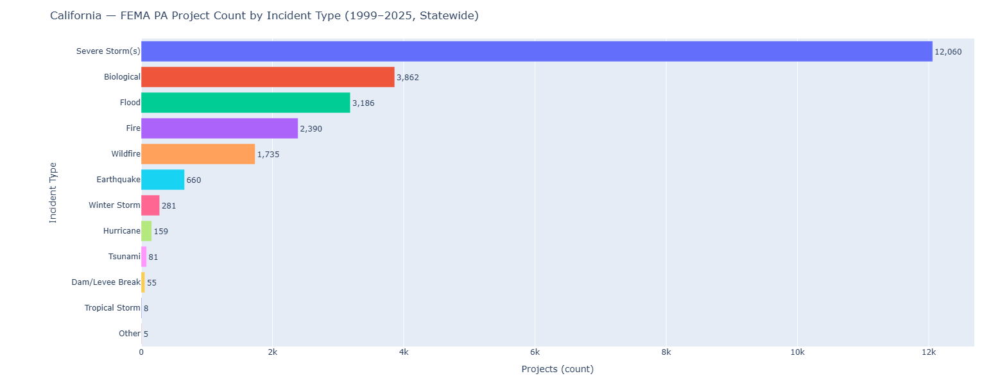

In [ ]:
proj_state_inc = (
    df.groupby("incidentType", as_index=False)["projectGuid"]
      .count()
      .rename(columns={"projectGuid":"projectCount"})
      .sort_values("projectCount", ascending=False)
)

fig_proj_state_inc = px.bar(
    proj_state_inc,
    x="projectCount", y="incidentType",
    orientation="h",
    color="incidentType",
    text="projectCount",
    labels={"projectCount":"Projects (count)", "incidentType":"Incident Type"},
    title="California — FEMA PA Project Count by Incident Type (1999–2025, Statewide)"
).update_traces(
    texttemplate="%{text:,}", textposition="outside",
    hovertemplate="<b>%{y}</b><br>Projects: %{x:,}"
).update_layout(
    height=600, width=900, showlegend=False,
    margin=dict(l=220, r=40, t=60, b=60)
)
fig_proj_state_inc.show()

/tmp/ipykernel_1582/1419063645.py:1: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



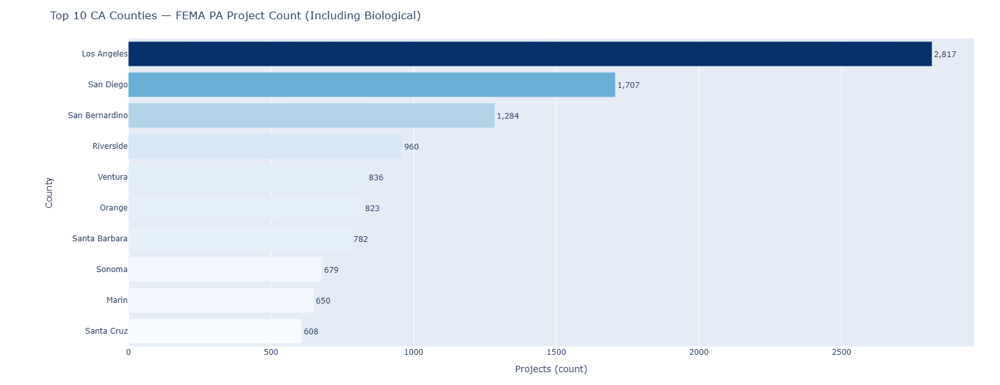

In [ ]:
mask_county_only = ~df["county"].astype(str).str.contains(r"\b(statewide|county[\s-]*wide)\b",
                                                          flags=re.IGNORECASE, na=False)
d_full = df.loc[mask_county_only].copy()
d_full["county_clean"] = d_full["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

top10_proj_inc = (
    d_full.groupby("county_clean", as_index=False)["projectGuid"].count()
          .rename(columns={"projectGuid":"projectCount"})
          .nlargest(10, "projectCount")
          .sort_values("projectCount", ascending=True)      
)

fig_top10_proj_inc = px.bar(
    top10_proj_inc,
    x="projectCount", y="county_clean",
    orientation="h",
    color="projectCount",
    color_continuous_scale="Blues",
    text="projectCount",
    labels={"projectCount":"Projects (count)", "county_clean":"County"},
    title="Top 10 CA Counties — FEMA PA Project Count (Including Biological)"
).update_traces(
    texttemplate="%{text:,}", textposition="outside",
    hovertemplate="<b>%{y}</b><br>Projects: %{x:,}"
).update_layout(
    height=600, width=950, coloraxis_showscale=False,
    margin=dict(l=200, r=40, t=60, b=60)
)
fig_top10_proj_inc.show()

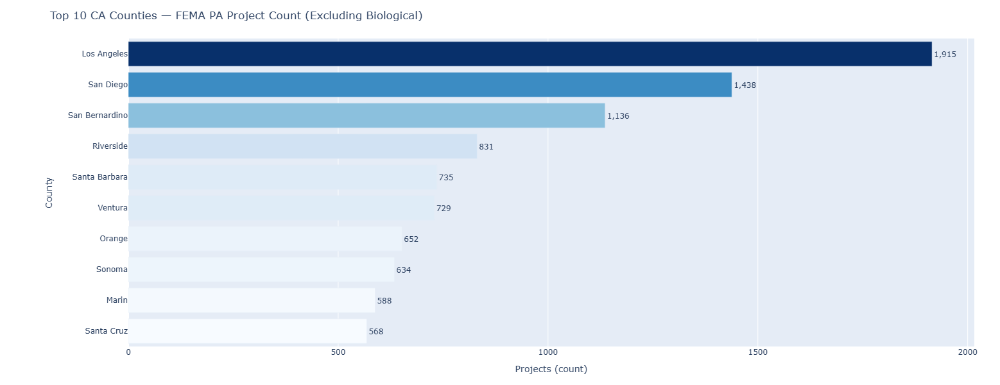

In [ ]:
mask_non_bio = ~df["incidentType"].astype(str).str.strip().str.casefold().eq("biological")
d_ex = df.loc[mask_county_only & mask_non_bio].copy()
d_ex["county_clean"] = d_ex["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

top10_proj_ex = (
    d_ex.groupby("county_clean", as_index=False)["projectGuid"].count()
        .rename(columns={"projectGuid":"projectCount"})
        .nlargest(10, "projectCount")
        .sort_values("projectCount", ascending=True)
)

fig_top10_proj_ex = px.bar(
    top10_proj_ex,
    x="projectCount", y="county_clean",
    orientation="h",
    color="projectCount",
    color_continuous_scale="Blues",
    text="projectCount",
    labels={"projectCount":"Projects (count)", "county_clean":"County"},
    title="Top 10 CA Counties — FEMA PA Project Count (Excluding Biological)"
).update_traces(
    texttemplate="%{text:,}", textposition="outside",
    hovertemplate="<b>%{y}</b><br>Projects: %{x:,}"
).update_layout(
    height=600, width=950, coloraxis_showscale=False,
    margin=dict(l=200, r=40, t=60, b=60)
)
fig_top10_proj_ex.show()

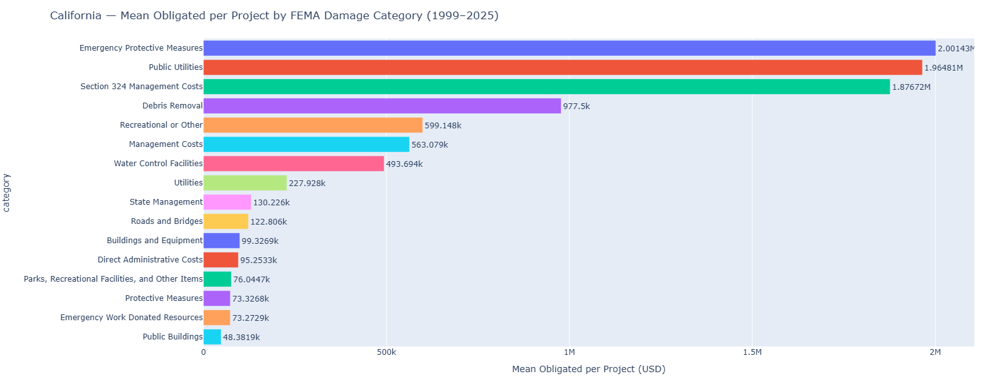

In [ ]:
mean_dc = (
    df.groupby("category", as_index=False)["totalObligated"].mean()
      .rename(columns={"totalObligated":"meanOblPerProject"})
      .sort_values("meanOblPerProject", ascending=False)
)

fig_mean_dc = px.bar(
    mean_dc,
    x="meanOblPerProject", y="category",
    orientation="h",
    color="category",
    text="meanOblPerProject",
    labels={"meanOblPerProject":"Mean Obligated per Project (USD)", "damageCategory":"Damage Category"},
    title="California — Mean Obligated per Project by FEMA Damage Category (1999–2025)"
).update_traces(
    texttemplate="%{text:~s}", textposition="outside",
    hovertemplate="<b>%{y}</b><br>Mean/project: %{x:,.0f}"
).update_layout(
    xaxis_tickformat="~s",
    height=600, width=900, showlegend=False,
    margin=dict(l=240, r=40, t=60, b=60)
)
fig_mean_dc.show()

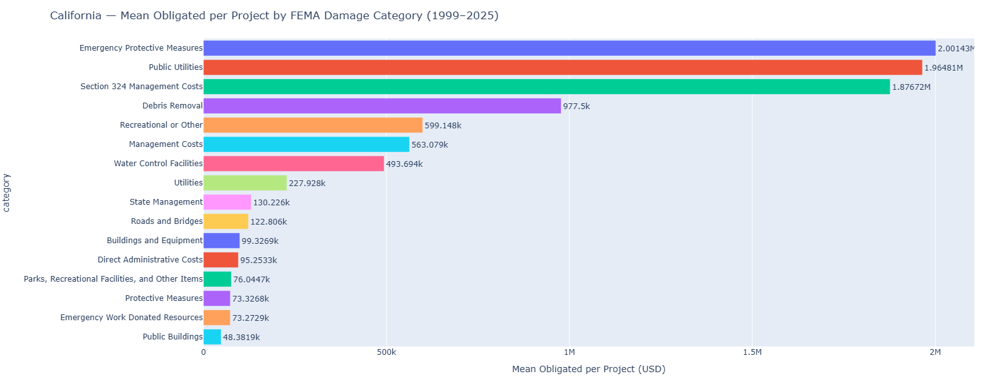

In [ ]:
mean_dc = (
    df.groupby("category", as_index=False)["totalObligated"].mean()
      .rename(columns={"totalObligated":"meanOblPerProject"})
      .sort_values("meanOblPerProject", ascending=False)
)

fig_mean_dc = px.bar(
    mean_dc,
    x="meanOblPerProject", y="category",
    orientation="h",
    color="category",
    text="meanOblPerProject",
    labels={"meanOblPerProject":"Mean Obligated per Project (USD)", "damageCategory":"Damage Category"},
    title="California — Mean Obligated per Project by FEMA Damage Category (1999–2025)"
).update_traces(
    texttemplate="%{text:~s}", textposition="outside",
    hovertemplate="<b>%{y}</b><br>Mean/project: %{x:,.0f}"
).update_layout(
    xaxis_tickformat="~s",
    height=600, width=900, showlegend=False,
    margin=dict(l=240, r=40, t=60, b=60)
)
fig_mean_dc.show()

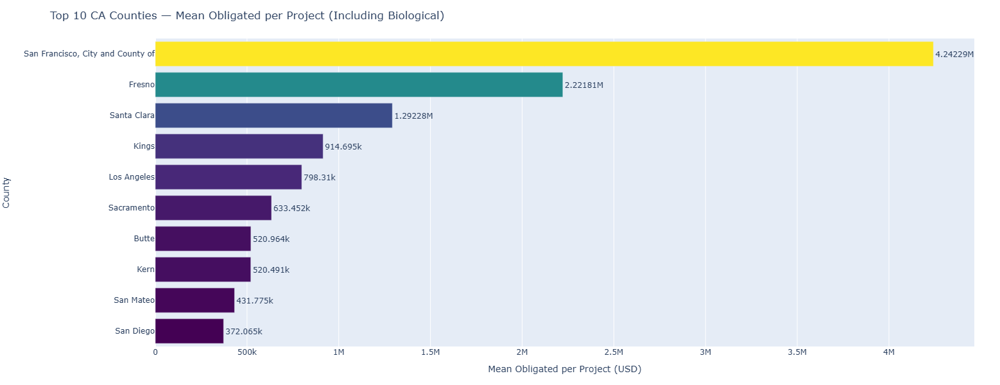

In [ ]:
mean_inc = (
    d_full.groupby("county_clean", as_index=False)["totalObligated"].mean()
          .rename(columns={"totalObligated":"meanOblPerProject"})
          .sort_values("meanOblPerProject", ascending=False)
          .head(10)
          .sort_values("meanOblPerProject", ascending=True)
)

fig_mean_inc = px.bar(
    mean_inc,
    x="meanOblPerProject", y="county_clean",
    orientation="h",
    color="meanOblPerProject",
    color_continuous_scale="Viridis",
    text="meanOblPerProject",
    labels={"meanOblPerProject":"Mean Obligated per Project (USD)", "county_clean":"County"},
    title="Top 10 CA Counties — Mean Obligated per Project (Including Biological)"
).update_traces(
    texttemplate="%{text:~s}", textposition="outside",
    hovertemplate="<b>%{y}</b><br>Mean/project: %{x:,.0f}"
).update_layout(
    xaxis_tickformat="~s",
    height=600, width=950, coloraxis_showscale=False,
    margin=dict(l=220, r=40, t=60, b=60)
)
fig_mean_inc.show()

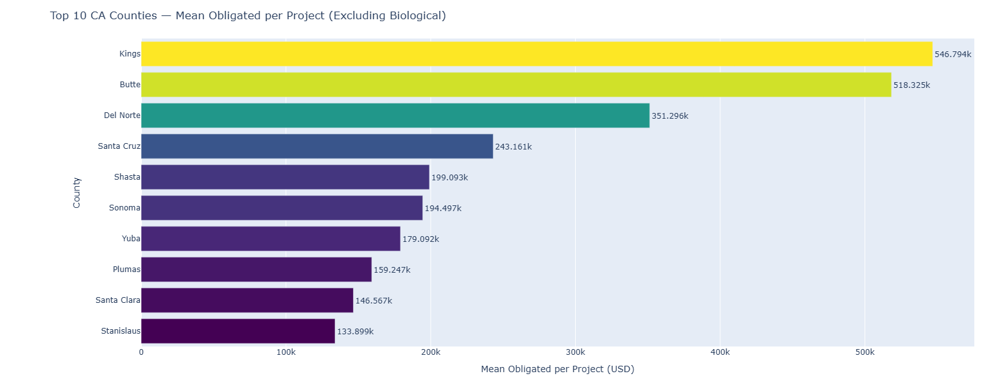

In [ ]:
mean_ex = (
    d_ex.groupby("county_clean", as_index=False)["totalObligated"].mean()
        .rename(columns={"totalObligated":"meanOblPerProject"})
        .sort_values("meanOblPerProject", ascending=False)
        .head(10)
        .sort_values("meanOblPerProject", ascending=True)
)

fig_mean_ex = px.bar(
    mean_ex,
    x="meanOblPerProject", y="county_clean",
    orientation="h",
    color="meanOblPerProject",
    color_continuous_scale="Viridis",
    text="meanOblPerProject",
    labels={"meanOblPerProject":"Mean Obligated per Project (USD)", "county_clean":"County"},
    title="Top 10 CA Counties — Mean Obligated per Project (Excluding Biological)"
).update_traces(
    texttemplate="%{text:~s}", textposition="outside",
    hovertemplate="<b>%{y}</b><br>Mean/project: %{x:,.0f}"
).update_layout(
    xaxis_tickformat="~s",
    height=600, width=950, coloraxis_showscale=False,
    margin=dict(l=220, r=40, t=60, b=60)
)
fig_mean_ex.show()

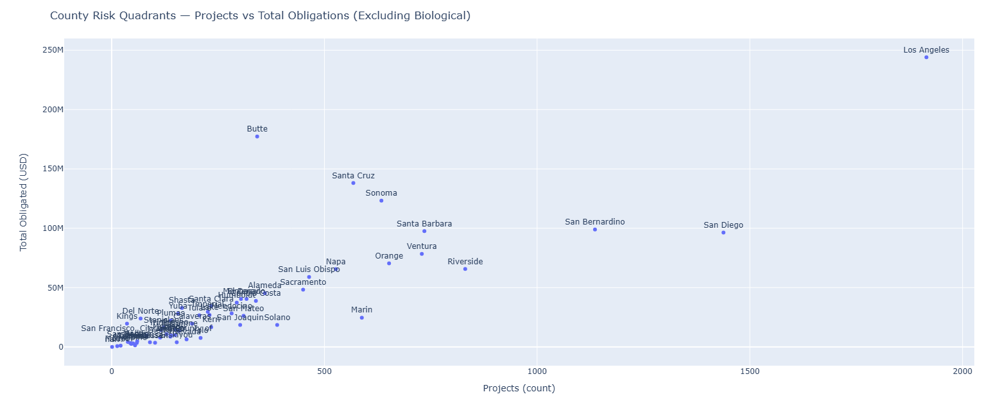

In [ ]:
risk_ex = (
    d_ex.groupby("county_clean", as_index=False)
        .agg(totalObl=("totalObligated","sum"),
             projects=("projectGuid","count"))
)

fig_risk_ex = px.scatter(
    risk_ex,
    x="projects", y="totalObl",
    text="county_clean",
    labels={"projects":"Projects (count)", "totalObl":"Total Obligated (USD)"},
    title="County Risk Quadrants — Projects vs Total Obligations (Excluding Biological)"
).update_traces(
    textposition="top center",
    hovertemplate="<b>%{text}</b><br>Projects: %{x:,}<br>Total: %{y:,.0f}"
).update_layout(
    yaxis_tickformat="~s",
    height=650, width=900,
    margin=dict(l=100, r=40, t=60, b=80)
)
fig_risk_ex.show()

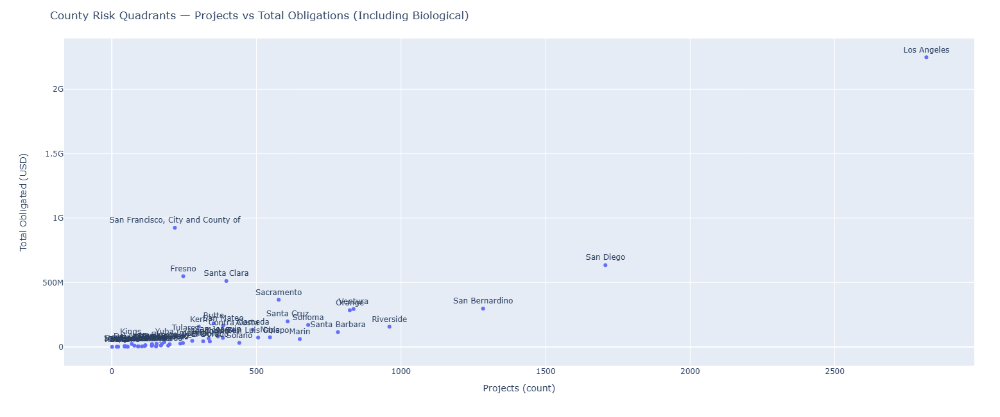

In [ ]:
risk_inc = (
    d_full.groupby("county_clean", as_index=False)
          .agg(totalObl=("totalObligated","sum"),
               projects=("projectGuid","count"))
)

fig_risk_inc = px.scatter(
    risk_inc,
    x="projects", y="totalObl",
    text="county_clean",
    labels={"projects":"Projects (count)", "totalObl":"Total Obligated (USD)"},
    title="County Risk Quadrants — Projects vs Total Obligations (Including Biological)"
).update_traces(
    textposition="top center",
    hovertemplate="<b>%{text}</b><br>Projects: %{x:,}<br>Total: %{y:,.0f}"
).update_layout(
    yaxis_tickformat="~s",
    height=650, width=900,
    margin=dict(l=100, r=40, t=60, b=80)
)
fig_risk_inc.show()

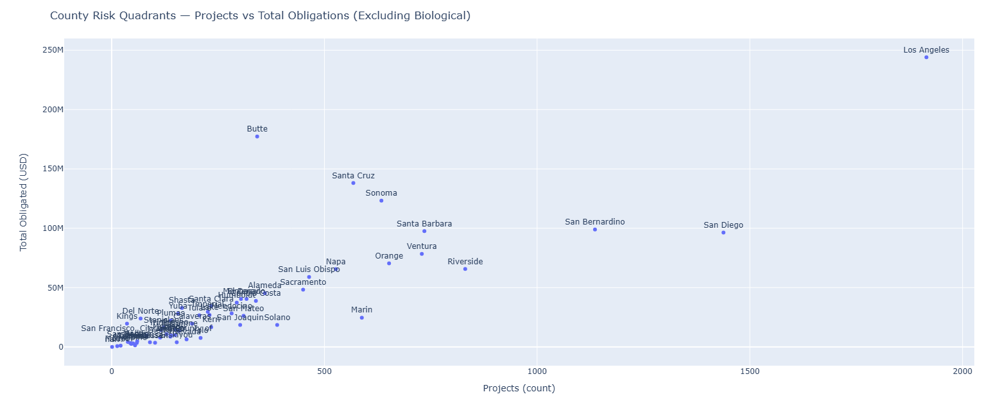

In [ ]:
risk_ex = (
    d_ex.groupby("county_clean", as_index=False)
        .agg(totalObl=("totalObligated","sum"),
             projects=("projectGuid","count"))
)

fig_risk_ex = px.scatter(
    risk_ex,
    x="projects", y="totalObl",
    text="county_clean",
    labels={"projects":"Projects (count)", "totalObl":"Total Obligated (USD)"},
    title="County Risk Quadrants — Projects vs Total Obligations (Excluding Biological)"
).update_traces(
    textposition="top center",
    hovertemplate="<b>%{text}</b><br>Projects: %{x:,}<br>Total: %{y:,.0f}"
).update_layout(
    yaxis_tickformat="~s",
    height=650, width=900,
    margin=dict(l=100, r=40, t=60, b=80)
)
fig_risk_ex.show()

/tmp/ipykernel_1582/2856415407.py:1: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



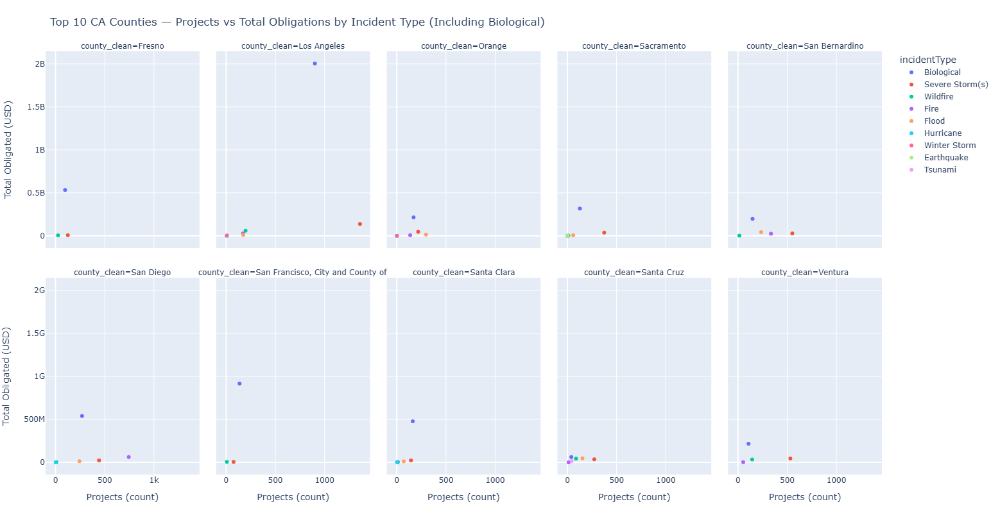

In [ ]:
mask_county_only = ~df["county"].astype(str).str.contains(
    r"\b(statewide|county[\s-]*wide)\b", flags=re.IGNORECASE, na=False
)
d_full = df.loc[mask_county_only].copy()
d_full["county_clean"] = d_full["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

top10_inc = (
    d_full.groupby("county_clean", as_index=False)["totalObligated"].sum()
          .nlargest(10, "totalObligated")["county_clean"].tolist()
)
sub_inc = d_full[d_full["county_clean"].isin(top10_inc)].copy()

agg_inc = (
    sub_inc.groupby(["county_clean","incidentType"], as_index=False)
           .agg(totalObl=("totalObligated","sum"),
                projects=("projectGuid","count"))
)

fig_scatter_inc = px.scatter(
    agg_inc,
    x="projects", y="totalObl",
    facet_col="county_clean", facet_col_wrap=5,
    color="incidentType",
    labels={"projects":"Projects (count)", "totalObl":"Total Obligated (USD)"},
    title="Top 10 CA Counties — Projects vs Total Obligations by Incident Type (Including Biological)"
)
fig_scatter_inc.update_traces(
    hovertemplate="<b>%{facet_col}</b><br>Incident: %{marker.color}<br>Projects: %{x:,}<br>Total: %{y:,.0f}"
)
fig_scatter_inc.update_layout(
    yaxis_tickformat="~s", xaxis_tickformat="~s",
    height=800, width=1200,
    margin=dict(l=60, r=40, t=80, b=60)
)
fig_scatter_inc.show()

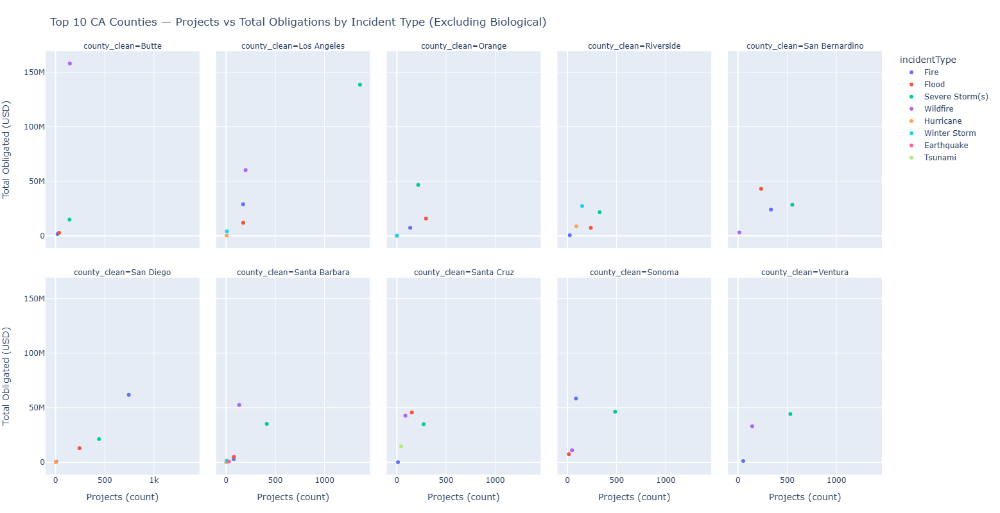

In [ ]:
mask_non_bio = ~df["incidentType"].astype(str).str.strip().str.casefold().eq("biological")
d_ex = df.loc[mask_county_only & mask_non_bio].copy()
d_ex["county_clean"] = d_ex["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

top10_ex = (
    d_ex.groupby("county_clean", as_index=False)["totalObligated"].sum()
        .nlargest(10, "totalObligated")["county_clean"].tolist()
)
sub_ex = d_ex[d_ex["county_clean"].isin(top10_ex)].copy()

agg_ex = (
    sub_ex.groupby(["county_clean","incidentType"], as_index=False)
          .agg(totalObl=("totalObligated","sum"),
               projects=("projectGuid","count"))
)

fig_scatter_ex = px.scatter(
    agg_ex,
    x="projects", y="totalObl",
    facet_col="county_clean", facet_col_wrap=5,
    color="incidentType",
    labels={"projects":"Projects (count)", "totalObl":"Total Obligated (USD)"},
    title="Top 10 CA Counties — Projects vs Total Obligations by Incident Type (Excluding Biological)"
)
fig_scatter_ex.update_traces(
    hovertemplate="<b>%{facet_col}</b><br>Incident: %{marker.color}<br>Projects: %{x:,}<br>Total: %{y:,.0f}"
)
fig_scatter_ex.update_layout(
    yaxis_tickformat="~s", xaxis_tickformat="~s",
    height=800, width=1200,
    margin=dict(l=60, r=40, t=80, b=60)
)
fig_scatter_ex.show()

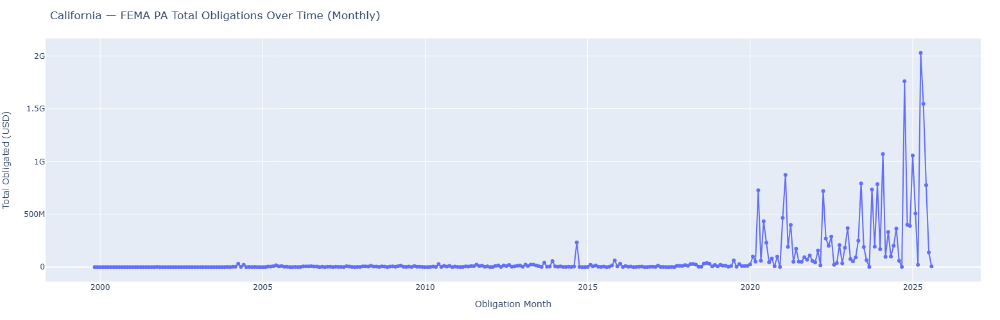

In [ ]:
df_dates = df.copy()
df_dates["obligationDate"] = pd.to_datetime(df_dates["obligationDate"], errors="coerce")
monthly = (df_dates.dropna(subset=["obligationDate"])
                  .groupby(pd.Grouper(key="obligationDate", freq="MS"))["totalObligated"]
                  .sum()
                  .reset_index())

fig_line = px.line(
    monthly, x="obligationDate", y="totalObligated",
    markers=True,
    labels={"obligationDate":"Obligation Month", "totalObligated":"Total Obligated (USD)"},
    title="California — FEMA PA Total Obligations Over Time (Monthly)"
)
fig_line.update_layout(yaxis_tickformat="~s", height=500, width=1000, margin=dict(l=60, r=30, t=60, b=60))
fig_line.update_traces(hovertemplate="%{x|%b %Y}<br>Total: %{y:,.0f}")

fig_line.show()

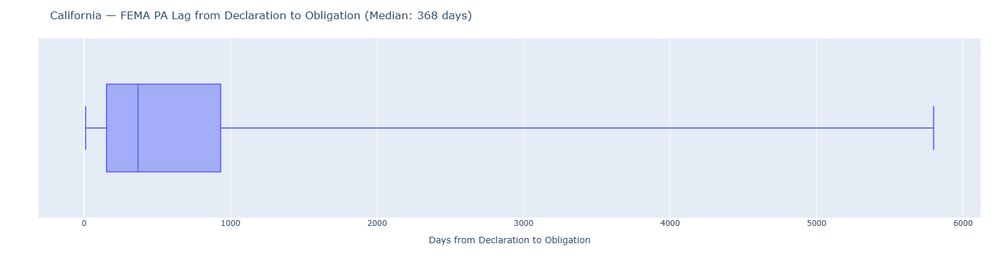

In [ ]:
lag_df = df.copy()
lag_df["declarationDate"] = pd.to_datetime(lag_df["declarationDate"], errors="coerce")
lag_df["obligationDate"] = pd.to_datetime(lag_df["obligationDate"], errors="coerce")
lag_df["lag_days"] = (lag_df["obligationDate"] - lag_df["declarationDate"]).dt.days

lag_clean = lag_df.dropna(subset=["lag_days"])
median_lag = int(lag_clean["lag_days"].median())

fig_lag = px.box(
    lag_clean, x="lag_days",
    points=False,
    labels={"lag_days":"Days from Declaration to Obligation"},
    title=f"California — FEMA PA Lag from Declaration to Obligation (Median: {median_lag} days)"
)
fig_lag.update_layout(height=400, width=900, margin=dict(l=60, r=30, t=60, b=60))
fig_lag.update_traces(hovertemplate="Lag: %{x} days")

fig_lag.show()

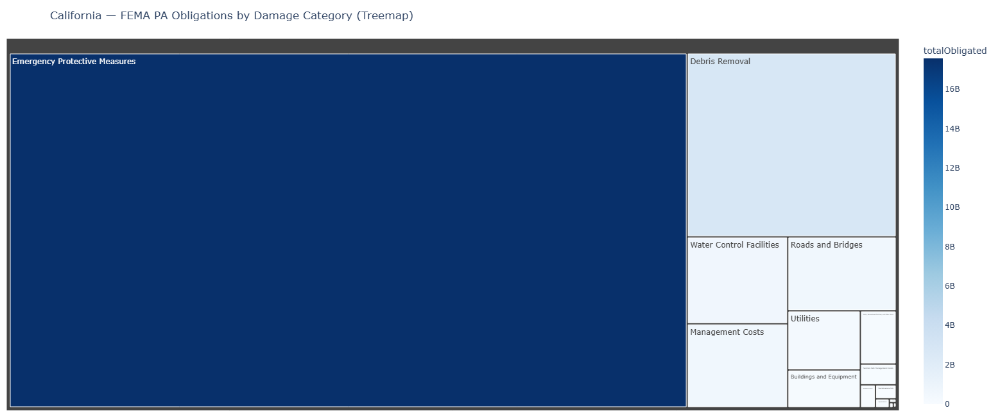

In [ ]:
dc_state = (
    df.groupby("category", as_index=False)["totalObligated"]
      .sum()
      .sort_values("totalObligated", ascending=False)
)

fig_tree = px.treemap(
    dc_state,
    path=["category"], values="totalObligated",
    color="totalObligated", color_continuous_scale="Blues",
    title="California — FEMA PA Obligations by Damage Category (Treemap)"
)
fig_tree.update_traces(
    hovertemplate="<b>%{label}</b><br>Total: %{value:,.0f}<extra></extra>"
)
fig_tree.update_layout(height=650, width=950, margin=dict(l=10, r=10, t=60, b=10))

fig_tree.show()

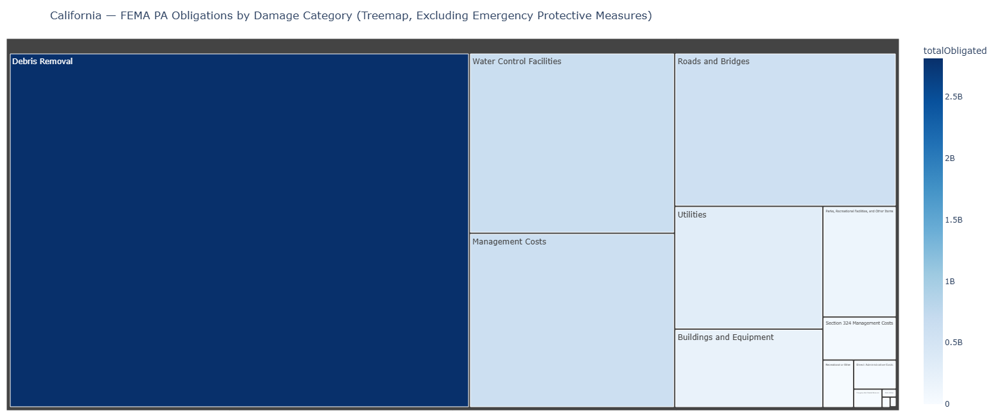

In [ ]:
mask_non_epm = ~df["category"].astype(str).str.strip().str.casefold().isin(
    ["b", "emergency protective measures"]
)

dc_state_no_epm = (
    df.loc[mask_non_epm]
      .groupby("category", as_index=False)["totalObligated"]
      .sum()
      .sort_values("totalObligated", ascending=False)
)

fig_tree_no_epm = px.treemap(
    dc_state_no_epm,
    path=["category"], values="totalObligated",
    color="totalObligated", color_continuous_scale="Blues",
    title="California — FEMA PA Obligations by Damage Category (Treemap, Excluding Emergency Protective Measures)"
)

fig_tree_no_epm.update_traces(
    hovertemplate="<b>%{label}</b><br>Total: %{value:,.0f}<extra></extra>"
)

fig_tree_no_epm.update_layout(
    height=650, width=950,
    margin=dict(l=10, r=10, t=60, b=10)
)

fig_tree_no_epm.show()

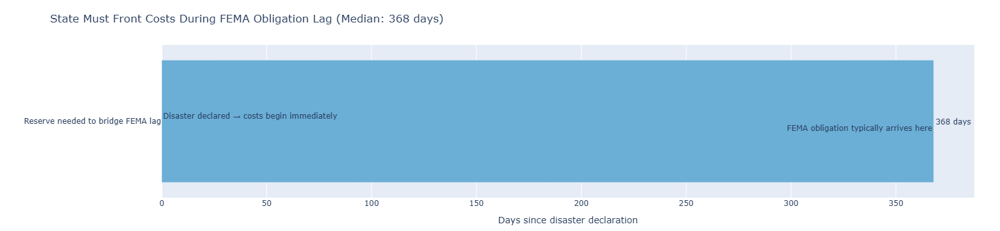

In [ ]:
lag_df = df.copy()
lag_df["declarationDate"] = pd.to_datetime(lag_df["declarationDate"], errors="coerce")
lag_df["obligationDate"] = pd.to_datetime(lag_df["obligationDate"], errors="coerce")
lag_df["lag_days"] = (lag_df["obligationDate"] - lag_df["declarationDate"]).dt.days
median_lag = int(lag_df["lag_days"].dropna().median())

bridge = pd.DataFrame({
    "Phase": ["Reserve needed to bridge FEMA lag"],
    "Days":  [median_lag]
})

fig_bridge = px.bar(
    bridge,
    x="Days", y="Phase",
    orientation="h",
    text="Days",
    color="Days",
    color_continuous_scale="Blues",
    labels={"Days":"Days since disaster declaration", "Phase":""},
    title=f"State Must prepare for 'State First' funding and FEMA Obligation Lag (Median: {median_lag} days)"
)

fig_bridge.update_traces(
    texttemplate="%{text} days",
    textposition="outside"
)

fig_bridge.update_layout(
    coloraxis_showscale=False,
    height=250, width=900,
    margin=dict(l=40, r=40, t=70, b=40),
    showlegend=False
)

fig_bridge.add_annotation(
    x=0, y=0,
    xanchor="left", yanchor="bottom",
    text="Disaster declared > costs begin immediately",
    showarrow=False, font=dict(size=12)
)

fig_bridge.add_annotation(
    x=median_lag, y=0,
    xanchor="right", yanchor="top",
    text="FEMA obligation median arrival time",
    showarrow=False, font=dict(size=12)
)

fig_bridge.show()

Statewide Reserve Target (COVID excluded; based on mean ANNUAL obligations): $125,019,130


/tmp/ipykernel_1582/3187594764.py:1: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



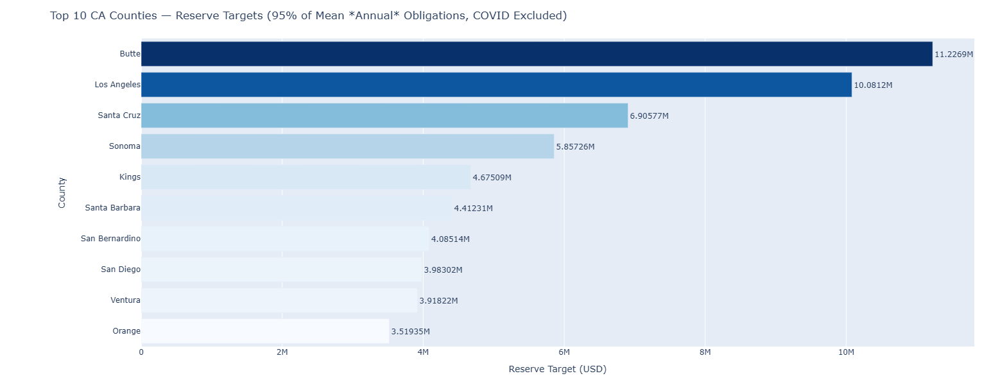

In [ ]:
mask_county_only = ~df["county"].astype(str).str.contains(
    r"\b(statewide|county[\s-]*wide)\b", flags=re.IGNORECASE, na=False
)
mask_non_bio = ~df["incidentType"].astype(str).str.strip().str.casefold().eq("biological")

d = df.loc[mask_county_only & mask_non_bio].copy()
d["county_clean"] = d["county"].astype(str).str.replace(r"\s+County$", "", regex=True)

d["obligationDate"] = pd.to_datetime(d["obligationDate"], errors="coerce")
d = d.dropna(subset=["obligationDate"])
d["year"] = d["obligationDate"].dt.year

annual = (
    d.groupby(["county_clean","year"], as_index=False)["totalObligated"]
      .sum()
      .rename(columns={"totalObligated":"annual_total"})
)

reserve_calc = (
    annual.groupby("county_clean", as_index=False)["annual_total"]
          .mean()
          .rename(columns={"annual_total":"mean_annual_obl"})
)

reserve_calc["reserveTarget"] = 0.95 * reserve_calc["mean_annual_obl"]

state_total_reserve = reserve_calc["reserveTarget"].sum()
print(f"Statewide Reserve Target (COVID excluded; based on mean ANNUAL obligations): ${state_total_reserve:,.0f}")

top10_reserve = (
    reserve_calc.sort_values("reserveTarget", ascending=False)
                .head(10)
                .sort_values("reserveTarget", ascending=True)
)

fig_reserve = px.bar(
    top10_reserve,
    x="reserveTarget", y="county_clean",
    orientation="h",
    color="reserveTarget",
    color_continuous_scale="Blues",
    text="reserveTarget",
    labels={"reserveTarget":"Reserve Target (USD)", "county_clean":"County"},
    title="Top 10 CA Counties — Reserve Targets (95% of Mean *Annual* Obligations, COVID Excluded)"
)

fig_reserve.update_traces(
    texttemplate="%{text:~s}", textposition="outside",
    hovertemplate="<b>%{y}</b><br>Reserve target: %{x:,.0f}"
)
fig_reserve.update_layout(
    xaxis_tickformat="~s",
    height=600, width=950,
    coloraxis_showscale=False,
    margin=dict(l=220, r=40, t=60, b=60)
)

fig_reserve.show()

In [ ]:
FRAME = df_base if 'df_base' in globals() else df

for c in ["declarationDate", "obligationDate"]:
    if c in FRAME.columns and not pd.api.types.is_datetime64_any_dtype(FRAME[c]):
        FRAME[c] = pd.to_datetime(FRAME[c], errors="coerce")

decl_m = (
    FRAME.set_index("declarationDate")["totalObligated"]
         .dropna()
         .resample("MS").sum()
)
oblg_m = (
    FRAME.set_index("obligationDate")["totalObligated"]
         .dropna()
         .resample("MS").sum()
)

ts = pd.concat(
    [decl_m.rename("By Declaration Month"),
     oblg_m.rename("By Obligation Month")],
    axis=1
).fillna(0)

ts.tail(3)

,By Declaration Month,By Obligation Month
2025-06-01 00:00:00+00:00,0.0,52489884.70
2025-07-01 00:00:00+00:00,0.0,6124227.35
2025-08-01 00:00:00+00:00,0.0,2771521.46


In [ ]:
FRAME = df

valid_cty = ~FRAME["county"].str.contains("statewide|countywide", case=False, na=False)

state_total = FRAME.loc[valid_cty, "totalObligated"].sum(min_count=1)

top10_full = (
    FRAME.loc[valid_cty]
         .groupby("county", as_index=False)["totalObligated"].sum()
         .sort_values("totalObligated", ascending=False)
         .head(10)
)
top10_full["share"] = top10_full["totalObligated"] / state_total

alt.data_transformers.disable_max_rows()

bars_full = (
    alt.Chart(top10_full)
      .mark_bar()
      .encode(
          y=alt.Y("county:N", sort='-x', title="County"),
          x=alt.X("share:Q", title="Share of State Total", axis=alt.Axis(format="%")),
          color=alt.Color("county:N", legend=None, scale=alt.Scale(scheme="category20")),
          tooltip=[
              alt.Tooltip("county:N", title="County"),
              alt.Tooltip("totalObligated:Q", title="Total Obligated ($)", format="$,"),
              alt.Tooltip("share:Q", title="Share of State", format=".1%")
          ]
      )
      .properties(width=900, height=700,
                  title="California — Top-10 Counties: Share of State Total (USD) 1999–2025")
)

labels_full = bars_full.mark_text(
    align="left", dx=3
).encode(text=alt.Text("share:Q", format=".1%"))

(bars_full + labels_full)

/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.LayerChart(...)

In [ ]:
if 'df_base' not in globals():
    mask_bio  = df["incidentType"].str.contains("Biological", case=False, na=False)
    mask_epm  = df["category"].str.contains(r"Emergency\s*Protective\s*Measures|^B\b",
                                            case=False, na=False)
    if "categoryCode" in df.columns:
        mask_epm |= df["categoryCode"].astype(str).str.upper().eq("B")
    mask_2020 = df["declarationDate"].dt.year.eq(2020)
    df_base   = df.loc[~(mask_bio | mask_epm | mask_2020)].copy()

FRAME = df_base
valid_cty = ~FRAME["county"].str.contains("statewide|countywide", case=False, na=False)

state_total_ex = FRAME.loc[valid_cty, "totalObligated"].sum(min_count=1)

top10_ex = (
    FRAME.loc[valid_cty]
         .groupby("county", as_index=False)["totalObligated"].sum()
         .sort_values("totalObligated", ascending=False)
         .head(10)
)
top10_ex["share"] = top10_ex["totalObligated"] / state_total_ex

bars_ex = (
    alt.Chart(top10_ex)
      .mark_bar()
      .encode(
          y=alt.Y("county:N", sort='-x', title="County"),
          x=alt.X("share:Q", title="Share of State Total (EX baseline)", axis=alt.Axis(format="%")),
          color=alt.Color("county:N", legend=None, scale=alt.Scale(scheme="category20")),
          tooltip=[
              alt.Tooltip("county:N", title="County"),
              alt.Tooltip("totalObligated:Q", title="Total Obligated ($)", format="$,"),
              alt.Tooltip("share:Q", title="Share of State", format=".1%")
          ]
      )
      .properties(width=900, height=700,
                  title="California — Top-10 Counties: Share of State Total (EX: no Biological / 2020 / EPM)")
)

labels_ex = bars_ex.mark_text(align="left", dx=3).encode(text=alt.Text("share:Q", format=".1%"))

(bars_ex + labels_ex)

/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.LayerChart(...)

In [ ]:
alt.data_transformers.disable_max_rows()

mask_geo = ~df["county"].str.contains("statewide|countywide", case=False, na=False)

top10 = (
    df.loc[mask_geo]
      .groupby("county", as_index=False)["totalObligated"].sum()
      .sort_values("totalObligated", ascending=False)
      .head(10)["county"]
      .tolist()
)

mix_full = (
    df.loc[mask_geo & df["county"].isin(top10)]
      .groupby(["county","incidentType"], as_index=False)["totalObligated"].sum()
)
totals = mix_full.groupby("county", as_index=False)["totalObligated"].sum().rename(columns={"totalObligated":"county_total"})
mix_full = mix_full.merge(totals, on="county", how="left")
mix_full["share"] = mix_full["totalObligated"] / mix_full["county_total"]

chart_full = (
    alt.Chart(mix_full)
      .mark_bar()
      .encode(
          y=alt.Y("county:N", sort=mix_full.groupby("county")["county_total"].max().sort_values(ascending=False).index.tolist(),
                  title="County"),
          x=alt.X("share:Q", stack="normalize", axis=alt.Axis(format="%"), title="Share of County Total"),
          color=alt.Color("incidentType:N", legend=alt.Legend(title="Incident Type"), scale=alt.Scale(scheme="category20")),
          tooltip=[
              alt.Tooltip("county:N", title="County"),
              alt.Tooltip("incidentType:N", title="Incident"),
              alt.Tooltip("totalObligated:Q", title="Dollars", format="$,.0f"),
              alt.Tooltip("share:Q", title="Share", format=".1%")
          ]
      )
      .properties(width=900, height=700,
                  title="California — Top-10 Counties: Incident Mix (FULL, 1999–2025)")
)
chart_full

/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.Chart(...)

In [ ]:
mask_bio  = df["incidentType"].str.contains("Biological", case=False, na=False)
mask_epm  = df["category"].str.contains(r"^B\b|Emergency\s*Protective\s*Measures", case=False, na=False)
mask_2020 = df["declarationDate"].dt.year.eq(2020)

FRAME = df.loc[~(mask_bio | mask_epm | mask_2020)].copy()

mask_geo = ~FRAME["county"].str.contains("statewide|countywide", case=False, na=False)

top10_ex = (
    FRAME.loc[mask_geo]
         .groupby("county", as_index=False)["totalObligated"].sum()
         .sort_values("totalObligated", ascending=False)
         .head(10)["county"]
         .tolist()
)

mix_ex = (
    FRAME.loc[mask_geo & FRAME["county"].isin(top10_ex)]
         .groupby(["county","incidentType"], as_index=False)["totalObligated"].sum()
)
totals_ex = mix_ex.groupby("county", as_index=False)["totalObligated"].sum().rename(columns={"totalObligated":"county_total"})
mix_ex = mix_ex.merge(totals_ex, on="county", how="left")
mix_ex["share"] = mix_ex["totalObligated"] / mix_ex["county_total"]

chart_ex = (
    alt.Chart(mix_ex)
      .mark_bar()
      .encode(
          y=alt.Y("county:N", sort=mix_ex.groupby("county")["county_total"].max().sort_values(ascending=False).index.tolist(),
                  title="County"),
          x=alt.X("share:Q", stack="normalize", axis=alt.Axis(format="%"), title="Share of County Total (EX)"),
          color=alt.Color("incidentType:N", legend=alt.Legend(title="Incident Type"), scale=alt.Scale(scheme="category20")),
          tooltip=[
              alt.Tooltip("county:N", title="County"),
              alt.Tooltip("incidentType:N", title="Incident"),
              alt.Tooltip("totalObligated:Q", title="Dollars", format="$,.0f"),
              alt.Tooltip("share:Q", title="Share", format=".1%")
          ]
      )
      .properties(width=900, height=700,
                  title="California — Top-10 Counties: Incident Mix (EX: no Biological / 2020 / EPM)")
)
chart_ex

/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.Chart(...)

In [ ]:
FRAME = df.copy()
mask_local = ~FRAME["county"].str.contains("statewide|countywide", case=False, na=False)

top10 = (FRAME.loc[mask_local]
         .groupby("county", as_index=False)["totalObligated"].sum()
         .sort_values("totalObligated", ascending=False)
         .head(10))
order = top10["county"].tolist()

sub = FRAME[FRAME["county"].isin(order)].copy()
by_cc = (sub.groupby(["county","category"], as_index=False)["totalObligated"].sum())
by_cc["county_total"]   = by_cc.groupby("county")["totalObligated"].transform("sum")
by_cc["pct_of_county"]  = by_cc["totalObligated"] / by_cc["county_total"]
by_cc["county"]         = pd.Categorical(by_cc["county"], categories=order, ordered=True)

import altair as alt
alt.data_transformers.disable_max_rows()

chart_full = (
    alt.Chart(by_cc)
      .mark_bar()
      .encode(
          y=alt.Y("county:N", sort=order, title="County"),
          x=alt.X("totalObligated:Q", stack="normalize",
                  axis=alt.Axis(format="%"), title="Share of County Total"),
          color=alt.Color("category:N",
                          legend=alt.Legend(title="Damage Category"),
                          scale=alt.Scale(scheme="category20")),
          tooltip=[
              alt.Tooltip("county:N",            title="County"),
              alt.Tooltip("category:N",          title="Category"),
              alt.Tooltip("totalObligated:Q",    title="Obligated ($)", format="$,.0f"),
              alt.Tooltip("pct_of_county:Q",     title="% of county",  format=".1%")
          ]
      )
      .properties(width=900, height=700,
                  title="California — Top-10 Counties: Damage Category Mix (1999–2025)")
)
chart_full

/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.Chart(...)

In [ ]:
if "df_base" in globals():
    FRAME_EX = df_base.copy()
else:
    FRAME_EX = df.copy()
    m_bio  = FRAME_EX["incidentType"].str.contains("Biological", case=False, na=False)
    m_epm  = FRAME_EX["category"].str.contains(r"Emergency\s*Protective\s*Measures|^B\b",
                                               case=False, na=False)
    if "categoryCode" in FRAME_EX.columns:
        m_epm |= FRAME_EX["categoryCode"].astype(str).str.upper().eq("B")
    m_2020 = FRAME_EX["declarationDate"].dt.year.eq(2020)
    FRAME_EX = FRAME_EX.loc[~(m_bio | m_epm | m_2020)].copy()

mask_local_ex = ~FRAME_EX["county"].str.contains("statewide|countywide", case=False, na=False)
top10_ex = (FRAME_EX.loc[mask_local_ex]
            .groupby("county", as_index=False)["totalObligated"].sum()
            .sort_values("totalObligated", ascending=False)
            .head(10))
order_ex = top10_ex["county"].tolist()

sub_ex = FRAME_EX[FRAME_EX["county"].isin(order_ex)].copy()
by_cc_ex = (sub_ex.groupby(["county","category"], as_index=False)["totalObligated"].sum())
by_cc_ex["county_total"]  = by_cc_ex.groupby("county")["totalObligated"].transform("sum")
by_cc_ex["pct_of_county"] = by_cc_ex["totalObligated"] / by_cc_ex["county_total"]
by_cc_ex["county"]        = pd.Categorical(by_cc_ex["county"], categories=order_ex, ordered=True)

chart_ex = (
    alt.Chart(by_cc_ex)
      .mark_bar()
      .encode(
          y=alt.Y("county:N", sort=order_ex, title="County"),
          x=alt.X("totalObligated:Q", stack="normalize",
                  axis=alt.Axis(format="%"), title="Share of County Total (EX)"),
          color=alt.Color("category:N",
                          legend=alt.Legend(title="Damage Category"),
                          scale=alt.Scale(scheme="category20")),
          tooltip=[
              alt.Tooltip("county:N",            title="County"),
              alt.Tooltip("category:N",          title="Category"),
              alt.Tooltip("totalObligated:Q",    title="Obligated ($)", format="$,.0f"),
              alt.Tooltip("pct_of_county:Q",     title="% of county",  format=".1%")
          ]
      )
      .properties(width=900, height=700,
                  title="California — Top-10 Counties: Damage Category Mix — EX (no Biological / 2020 / EPM)")
)
chart_ex

/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.Chart(...)

In [ ]:
full_data = (
    df.loc[mask_real & df["county"].isin(top10)]
      .loc[df["lag_days_obligation"].ge(0)]
)

full_base = (
    alt.Chart(full_data)
      .mark_boxplot(extent="min-max")  # width handled by layout; size optional
      .encode(
          x=alt.X("incidentType:N", title="Incident Type"),
          y=alt.Y("lag_days_obligation:Q", title="Lag (days)"),
          color=alt.Color("incidentType:N",
                          legend=alt.Legend(title="Incident Type"),
                          scale=alt.Scale(scheme=ALTAIR_SCHEME)),
          tooltip=[
              alt.Tooltip("county:N",               title="County"),
              alt.Tooltip("incidentType:N",         title="Incident"),
              alt.Tooltip("lag_days_obligation:Q",  title="Lag (days)", format=",.0f"),
              alt.Tooltip("totalObligated:Q",       title="Total Obligated", format="$,.0f")
          ]
      )
      .properties(width=220, height=170)
)

full_chart = full_base.facet(
    "county:N",
    columns=5,
    title="California — Top-10 Counties: Lag (Declaration → Obligation) by Incident Type — FULL"
)
full_chart

/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert

alt.FacetChart(...)

In [ ]:
mask_bio  = df["incidentType"].str.contains("Biological", case=False, na=False)
mask_epm  = df["category"].str.contains(r"Emergency\s*Protective\s*Measures|^B\b",
                                        case=False, na=False)
mask_2020 = df["declarationDate"].dt.year.eq(2020)

ex_data = (
    df.loc[mask_real & ~(mask_bio | mask_epm | mask_2020) & df["county"].isin(top10)]
      .loc[df["lag_days_obligation"].ge(0)]
)

ex_base = (
    alt.Chart(ex_data)
      .mark_boxplot(extent="min-max")
      .encode(
          x=alt.X("incidentType:N", title="Incident Type"),
          y=alt.Y("lag_days_obligation:Q", title="Lag (days)"),
          color=alt.Color("incidentType:N",
                          legend=alt.Legend(title="Incident Type"),
                          scale=alt.Scale(scheme=ALTAIR_SCHEME)),
          tooltip=[
              alt.Tooltip("county:N",               title="County"),
              alt.Tooltip("incidentType:N",         title="Incident"),
              alt.Tooltip("lag_days_obligation:Q",  title="Lag (days)", format=",.0f"),
              alt.Tooltip("totalObligated:Q",       title="Total Obligated", format="$,.0f")
          ]
      )
      .properties(width=220, height=170)
)

ex_chart = ex_base.facet(
    "county:N",
    columns=5,
    title="California — Top-10 Counties: Lag (Declaration → Obligation) by Incident Type — EX (no Biological / 2020 / EPM)"
)
ex_chart

/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert

alt.FacetChart(...)

/tmp/ipykernel_3380/4109245184.py:3: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df_ex["month"] = df_ex["declarationDate"].dt.to_period("M").dt.to_timestamp()


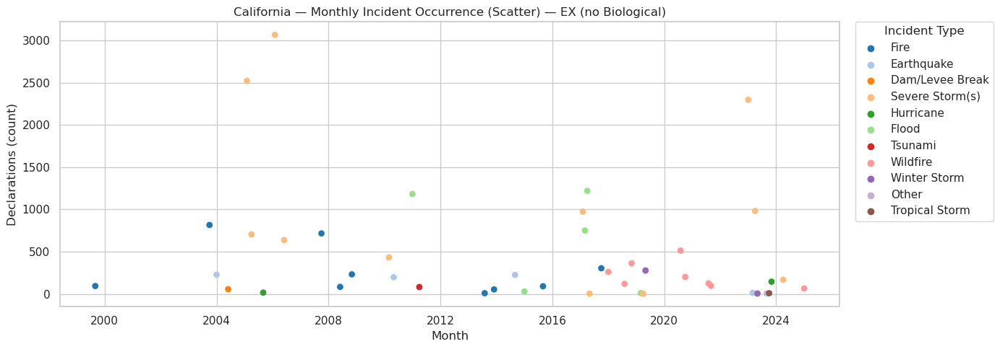

In [ ]:
mask_bio = df["incidentType"].str.contains("Biological", case=False, na=False)
df_ex = df.loc[~mask_bio & df["declarationDate"].notna()].copy()
df_ex["month"] = df_ex["declarationDate"].dt.to_period("M").dt.to_timestamp()

state_inc = (
    df_ex.groupby(["month", "incidentType"], as_index=False)
         .size()
         .rename(columns={"size": "count"})
)

plt.figure(figsize=(14, 5))
sns.scatterplot(
    data=state_inc, x="month", y="count",
    hue="incidentType", palette="tab20", s=40, edgecolor="none"
)
plt.title("California — Monthly Incident Occurrence (Scatter) — EX (no Biological)")
plt.xlabel("Month"); plt.ylabel("Declarations (count)")
plt.legend(title="Incident Type", bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
plt.tight_layout(); plt.show()

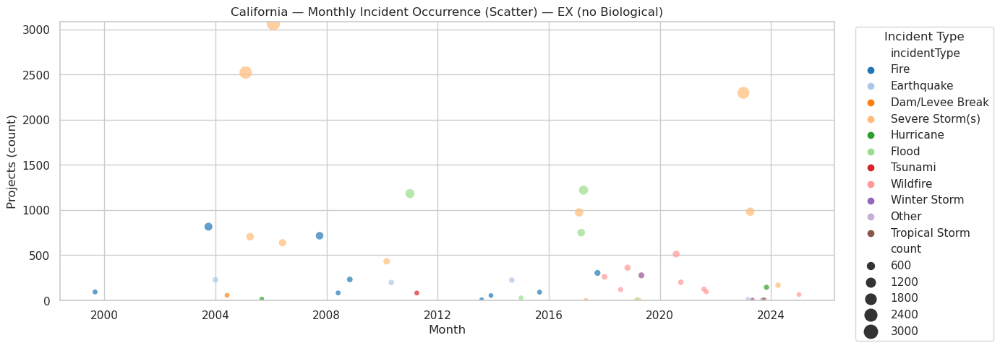

In [ ]:
plt.figure(figsize=(14,5))
sns.scatterplot(
    data=state_inc, x="month", y="count",
    hue="incidentType", size="count", sizes=(20, 180),
    palette="tab20", alpha=0.7, edgecolor="none"
)
plt.title("California — Monthly Incident Occurrence (Scatter) — EX (no Biological)")
plt.xlabel("Month")
plt.ylabel("Projects (count)")    
ymax = state_inc["count"].quantile(0.995)
plt.ylim(0, ymax * 1.05)
plt.legend(title="Incident Type", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout(); plt.show()

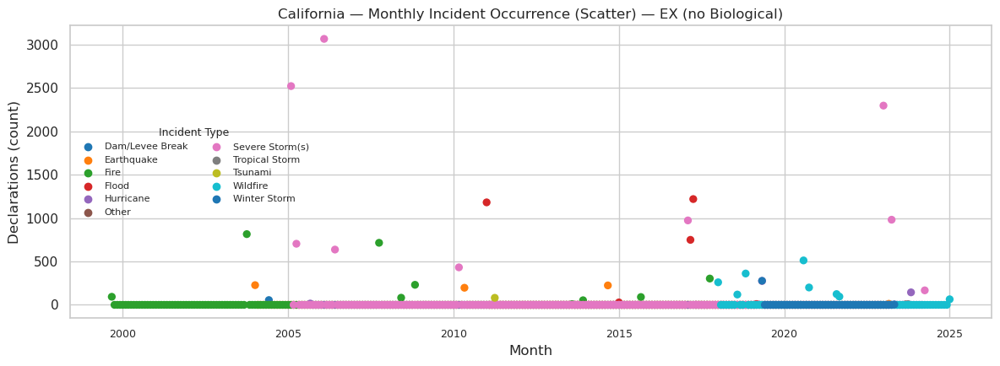

In [ ]:
mask_bio = df["incidentType"].str.contains("Biological", case=False, na=False)
ex = df.loc[~mask_bio].copy()

state_m = (
    ex.set_index("declarationDate")
      .groupby("incidentType")
      .resample("MS")              
      .size()
      .reset_index(name="count")
)


plt.figure(figsize=(12, 4.5))
ax = sns.scatterplot(
    data=state_m,
    x="declarationDate",
    y="count",
    hue="incidentType",
    palette="tab10",
    s=45,
    edgecolor="none"
)

locator   = mdates.AutoDateLocator(minticks=5, maxticks=7)
formatter = mdates.ConciseDateFormatter(locator)
ax.xaxis.set_major_locator(locator)
ax.xaxis.set_major_formatter(formatter)
ax.tick_params(axis="x", labelsize=9)

ax.set_title("California — Monthly Incident Occurrence (Scatter) — EX (no Biological)")
ax.set_xlabel("Month")
ax.set_ylabel("Declarations (count)")
ax.legend(title="Incident Type", ncol=2, fontsize=8, title_fontsize=9, frameon=False)
plt.tight_layout()
plt.show()

In [ ]:
top10 = (
    ex.groupby("county", dropna=True)["totalObligated"]
      .sum()
      .sort_values(ascending=False)
      .head(10)
      .index
)

county_m = (
    ex.loc[ex["county"].isin(top10)]
      .set_index("declarationDate")
      .groupby(["county", "incidentType"])
      .resample("MS")
      .size()
      .reset_index(name="count")
)

g = sns.relplot(
    data=county_m,
    x="declarationDate",
    y="count",
    hue="incidentType",
    col="county",
    col_wrap=5,
    kind="scatter",
    s=30,
    facet_kws=dict(sharex=True, sharey=False),
    height=2.4,
    aspect=1.25,
    palette="tab10"
)

locator   = mdates.AutoDateLocator(minticks=5, maxticks=7)
formatter = mdates.ConciseDateFormatter(locator)
for ax in g.axes.flat:
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(formatter)
    ax.tick_params(axis="x", labelsize=8)
    ax.set_xlabel("Month")
    ax.set_ylabel("Projects (count)")

g.set_titles(col_template="{col_name}")
g._legend.set_title("Incident Type")
for t in g._legend.texts: t.set_fontsize(8)
g._legend.set_frame_on(False)
g.add_legend(
    bbox_to_anchor=(1.02, 0.5),   
    loc="center left",
    borderaxespad=0.
)
g.fig.subplots_adjust(right=0.80) 
g.fig.suptitle("Top-10 Counties — Monthly Incident Occurrence (Scatter) — EX (no Biological)", y=1.02, fontsize=12)
plt.tight_layout()
plt.show()

NameError: name 'ex' is not defined